In [1]:
%matplotlib inline

In [2]:
import os
from astropy.io import fits as py
import numpy as np
import matplotlib.pyplot as plt

#from scipy.interpolate import interp1d

plt.rcParams['figure.figsize'] = (20, 8)
plt.rcParams['font.size'] = 25

In [3]:
def Normalization(data_x, data_y, bins, p_order, fraction, plot, section=0):
    # Input Parameters
    sbin = bins   # of bins used'
    nord = p_order    # order of the curve fitting (>6 is spline)
    frac = fraction # the upper fraction points defined as cont
    #plot = True # plot keyword (1 on, 2 more info,0 off)
    mask = []   # indicies of points to use (or used) in fit'
    bot  = False  # if set then bottom of spectrum is fit
    edit = True   # manuel editing by point (1 on, 0 off)
    temr = 'none' # selects terminal version of point'
    fill_value = 12500.0 # in case of a spline
    
    c = data_x
    s = data_y
    
    
    # Set Parameters
    Len = len(s)
    st = 0
    w = range(Len)
    if plot :
        plt.figure()
        ss = s
        if len(mask) > 0:
            ss = np.ones_like(s)*3*np.max(s)
            ss[mask] = s[mask]
        plt.plot(w, ss)
    mbin = [[] for i in range(sbin)]
    mbw  = [[] for i in range(sbin)]
    mid = 1    # affects how FRAC is interpreted(originally 2)
    
    #Mask out portions of spectrum, if a valid mask was passed or constructed.
    if len(mask) > 1:     # true: valid mask exists
        wsec = w[mask]    # wavelengths of valid continuum points
        ssec = s[mask]    # valid continuum points
    else:
        wsec = w
        ssec = s
        
    Len = len(ssec)
    lb  = Len/sbin


    #***find continuum in each bin
    st = 0
    bpt = lb*(1. - frac/mid)  #is a number
    if bot: bpt=lb*frac/mid
    for nbin in range(sbin):
        nd  = st +lb -1
        wb  = np.array(wsec[int(st):int(nd)])
        Bin = np.array(ssec[int(st):int(nd)])
        Sorted = np.argsort(Bin)  # sort data 
        cnt = Bin[Sorted[int(bpt):].astype(int)]
        cnw = wb[Sorted[int(bpt):].astype(int)]
        st  = nd + 1
        mbin[nbin] = cnt
        mbw[nbin]  = cnw
        if plot:  # remove or comment if the date is too big
            plt.plot(wb, Bin)
            plt.plot(cnw, cnt, '.k')
            
    temp_x = []
    temp_y = []
    for i in range(len(mbw)):
        temp_x.extend(mbw[i])
        temp_y.extend(mbin[i])

    temp_x = np.array(temp_x)
    temp_y = np.array(temp_y)
    mbin  = [x for _, x in sorted(zip(temp_x, temp_y))]
    mbw = sorted(temp_x)

    if plot:
        plt.figure()
        plt.plot(mbw, mbin, 'ko')
        
    #***polynomial or spline fit to continuum
    npl = nord 
    x = mbw 
    y = mbin
    if nord <= 6:
        if nord >= sbin: npl = sbin-1
        nx = len(x)
        mn = np.sum(x)/nx
        x  = x - mn   
        wf = w-mn
        #mn = mean(x)   &   x=x - mn   &   wf=float(w-mn)
        cf = np.polyfit(x,y,npl)     #call poly_fit(intrinsic)
        # be carefull, it returns coeficient in the oposite order.
        c  = np.polyval(cf, wf)      #call poly
        print(cf)
    else:
        wf = w
        print(np.min(x), np.max(x))
        print(np.min(wf), np.max(wf))
        f_interp = interp1d(x, y, bounds_error=False, fill_value=fill_value)
        c = f_interp(wf)
        
    #Plot
    if plot:
        plt.figure()
        plt.plot(w, c, 'k', lw=3)
        plt.plot(w, s, 'C0-')
        plt.plot(mbw,mbin, 'r', alpha=0.5)
        plt.figure()
        plt.plot(w, c, 'k', lw=3)
        plt.plot(mbw,mbin, 'r.', alpha = 0.5)
        plt.figure()
        plt.plot(w, s/c, 'k.')
        plt.plot(w, np.ones(len(w)), '--r', lw=2)
        plt.ylim(0.0,1.2)
    #plt.plot(data_x, s/c, ',')
    #plt.plot(data_x, np.ones(len(w)), '--r', lw=2)
    #plt.text(data_x[0], 0.8, str(section))
    plt.ylim(0.5,1.2)
    return data_x, s/c

In [4]:
# Read the files
path = '/Users/ricardoramirez/reflex_data/PersonalReduction/Reduce1/'

In [5]:
frame_spec = []
frame_error_spec = []
frame_WL = []

for i in range(100):
    print         (path + str(i+100) + "/cr2res_obs_staring_extracted.fits")
    fits = py.open(path + str(i+100) + "/cr2res_obs_staring_extracted.fits")
    raw_data1 = fits[1].data
    raw_data2 = fits[2].data
    raw_data3 = fits[3].data
    
    spec       = [[] for i in range(21)]
    error_spec = [[] for i in range(21)]
    WL         = [[] for i in range(21)]
    
    for a in range(2048):
        for b in range(6):
            spec[b].        append(raw_data1[a][b*3])
            error_spec[b].  append(raw_data1[a][b*3+1])
            WL[b].          append(raw_data1[a][b*3+2])
        for b in range(6):
            spec[b+6].      append(raw_data2[a][b*3])
            error_spec[b+6].append(raw_data2[a][b*3+1])
            WL[b+6].        append(raw_data2[a][b*3+2])
        for b in range(6):
            try:
                spec[b+12]. append(raw_data3[a][b*3])
            except: break
            error_spec[b+6].append(raw_data3[a][b*3+1])
            WL[b+12].       append(raw_data3[a][b*3+2])
            
    frame_spec.append(spec)
    frame_error_spec.append(error_spec)
    frame_WL.append(WL)

/Users/ricardoramirez/reflex_data/PersonalReduction/Reduce1/100/cr2res_obs_staring_extracted.fits
/Users/ricardoramirez/reflex_data/PersonalReduction/Reduce1/101/cr2res_obs_staring_extracted.fits
/Users/ricardoramirez/reflex_data/PersonalReduction/Reduce1/102/cr2res_obs_staring_extracted.fits
/Users/ricardoramirez/reflex_data/PersonalReduction/Reduce1/103/cr2res_obs_staring_extracted.fits
/Users/ricardoramirez/reflex_data/PersonalReduction/Reduce1/104/cr2res_obs_staring_extracted.fits
/Users/ricardoramirez/reflex_data/PersonalReduction/Reduce1/105/cr2res_obs_staring_extracted.fits
/Users/ricardoramirez/reflex_data/PersonalReduction/Reduce1/106/cr2res_obs_staring_extracted.fits
/Users/ricardoramirez/reflex_data/PersonalReduction/Reduce1/107/cr2res_obs_staring_extracted.fits
/Users/ricardoramirez/reflex_data/PersonalReduction/Reduce1/108/cr2res_obs_staring_extracted.fits
/Users/ricardoramirez/reflex_data/PersonalReduction/Reduce1/109/cr2res_obs_staring_extracted.fits
/Users/ricardoramire

/Users/ricardoramirez/reflex_data/PersonalReduction/Reduce1/184/cr2res_obs_staring_extracted.fits
/Users/ricardoramirez/reflex_data/PersonalReduction/Reduce1/185/cr2res_obs_staring_extracted.fits
/Users/ricardoramirez/reflex_data/PersonalReduction/Reduce1/186/cr2res_obs_staring_extracted.fits
/Users/ricardoramirez/reflex_data/PersonalReduction/Reduce1/187/cr2res_obs_staring_extracted.fits
/Users/ricardoramirez/reflex_data/PersonalReduction/Reduce1/188/cr2res_obs_staring_extracted.fits
/Users/ricardoramirez/reflex_data/PersonalReduction/Reduce1/189/cr2res_obs_staring_extracted.fits
/Users/ricardoramirez/reflex_data/PersonalReduction/Reduce1/190/cr2res_obs_staring_extracted.fits
/Users/ricardoramirez/reflex_data/PersonalReduction/Reduce1/191/cr2res_obs_staring_extracted.fits
/Users/ricardoramirez/reflex_data/PersonalReduction/Reduce1/192/cr2res_obs_staring_extracted.fits
/Users/ricardoramirez/reflex_data/PersonalReduction/Reduce1/193/cr2res_obs_staring_extracted.fits
/Users/ricardoramire

Text(0, 0.5, 'ADU')

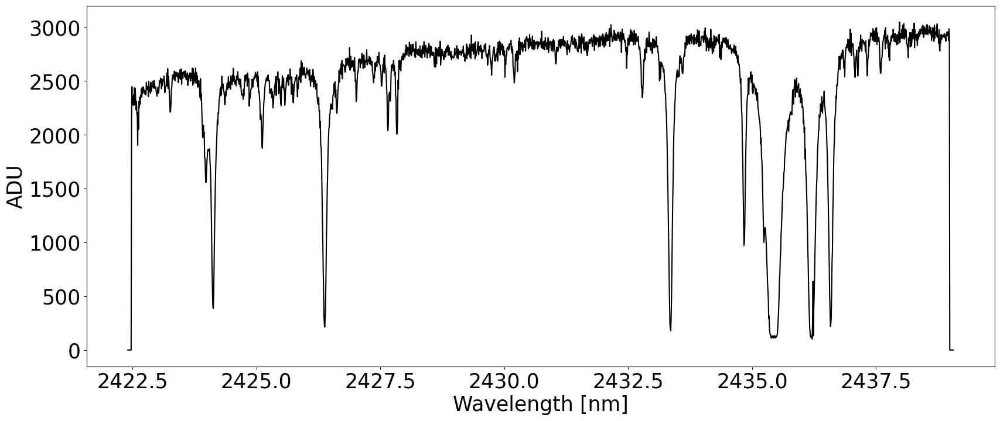

In [6]:
Frame = 0
#spec = frame_spec[Frame]
#WL = frame_error_spec[Frame]

n = 0
plt.plot(WL[n], spec[n], 'k')
plt.xlabel(r'Wavelength [nm]')
plt.ylabel(r'ADU')

Text(0, 0.5, 'ADU')

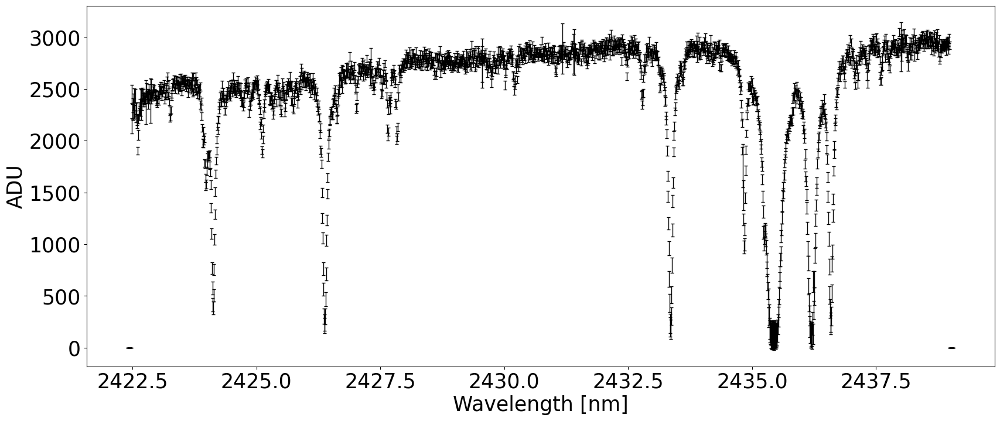

In [7]:
n = 0
plt.errorbar(WL[n], spec[n], yerr=error_spec[n], color ='k', fmt=',', capsize=2 , markersize=1, elinewidth=1)
#plt.ylim(2000,11000)
#plt.xlim(2382, 2384)
plt.xlabel(r'Wavelength [nm]')
plt.ylabel(r'ADU')

(-100.0, 4000.0)

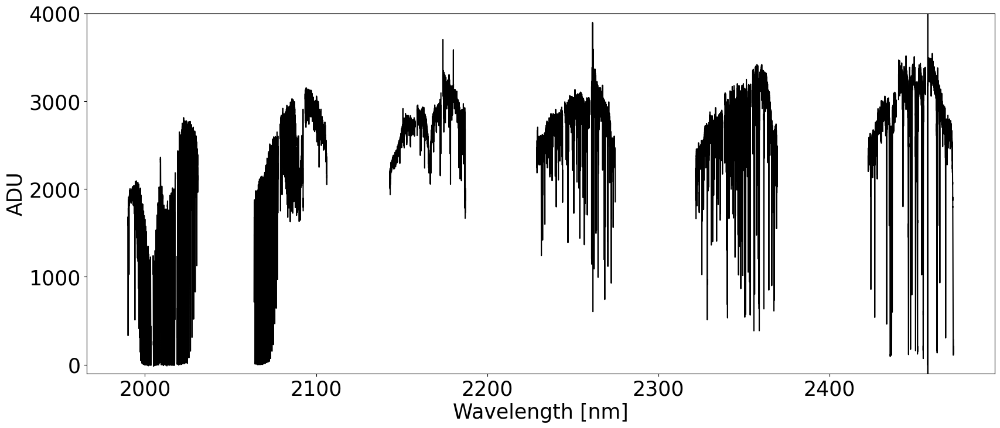

In [8]:
frame = 0
for i in range(21):
    #plt.plot(frame_WL[frame][i], frame_spec[frame][i], 'C'+str(frame))
    plt.plot(frame_WL[frame][i][10:-12], frame_spec[frame][i][10:-12], 'k')
plt.xlabel(r'Wavelength [nm]')
plt.ylabel(r'ADU')
plt.ylim(-100, 4000)

(-100.0, 4000.0)

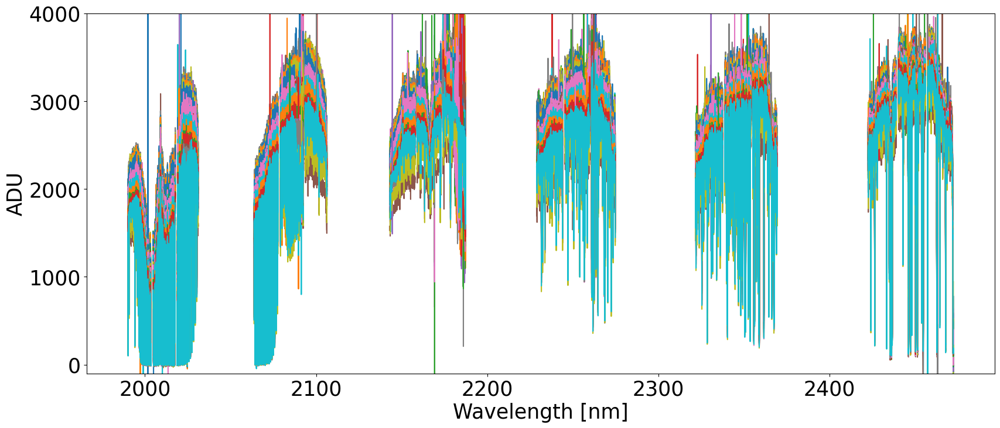

In [9]:
for frame in range(100):
    for i in range(21):
        plt.plot(frame_WL[frame][i][10:-12], frame_spec[frame][i][10:-12], 'C'+str(frame))
plt.xlabel(r'Wavelength [nm]')
plt.ylabel(r'ADU')
plt.ylim(-100, 4000)

(-100.0, 4000.0)

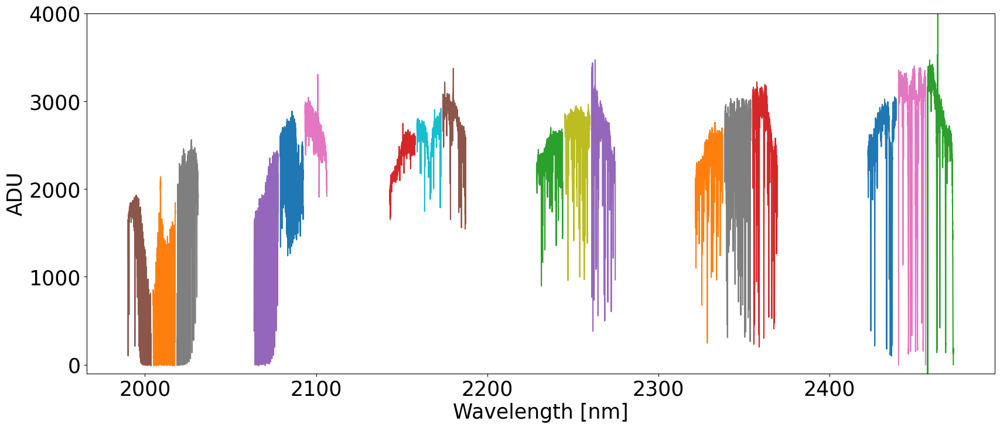

In [10]:
for i in range(21):
    plt.plot(frame_WL[frame][i][9:-10], frame_spec[frame][i][9:-10])
plt.xlabel(r'Wavelength [nm]')
plt.ylabel(r'ADU')
plt.ylim(-100, 4000)

Text(0, 0.5, 'ADU')

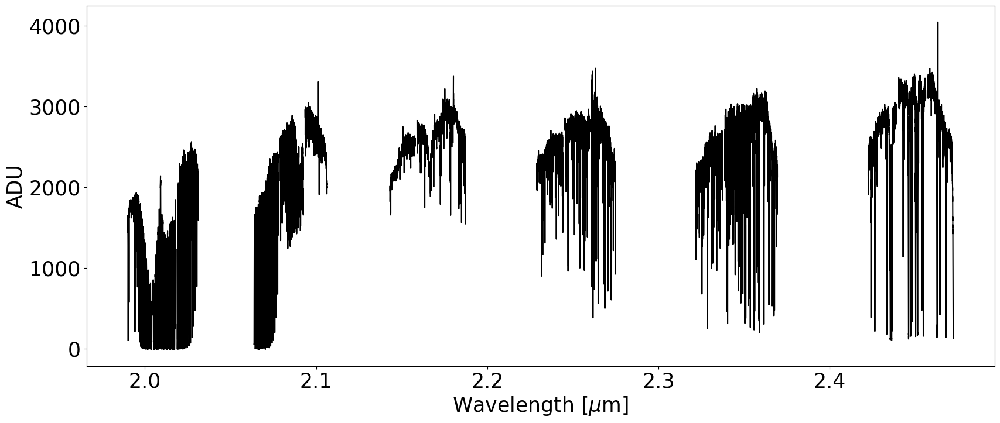

In [11]:
i = 5
plt.plot(np.array(frame_WL[frame][i][4:-4])/1000, frame_spec[frame][i][4:-4], 'k')
i = 11
plt.plot(np.array(frame_WL[frame][i][4:-4])/1000, frame_spec[frame][i][4:-4], 'k')
i = 17
plt.plot(np.array(frame_WL[frame][i][3:-4])/1000, frame_spec[frame][i][3:-4], 'k')

i = 4
plt.plot(np.array(frame_WL[frame][i][4:-4])/1000, frame_spec[frame][i][4:-4], 'k')
i = 10
plt.plot(np.array(frame_WL[frame][i][4:-5])/1000, frame_spec[frame][i][4:-5], 'k')
i = 16
plt.plot(np.array(frame_WL[frame][i][5:-5])/1000, frame_spec[frame][i][5:-5], 'k')

i = 3
plt.plot(np.array(frame_WL[frame][i][5:-5])/1000, frame_spec[frame][i][5:-5], 'k')
i = 9
plt.plot(np.array(frame_WL[frame][i][6:-6])/1000, frame_spec[frame][i][6:-6], 'k')
i = 15
plt.plot(np.array(frame_WL[frame][i][6:-6])/1000, frame_spec[frame][i][6:-6], 'k')

i = 2
plt.plot(np.array(frame_WL[frame][i][7:-7])/1000, frame_spec[frame][i][7:-7], 'k')
i = 8
plt.plot(np.array(frame_WL[frame][i][6:-7])/1000, frame_spec[frame][i][6:-7], 'k')
i = 14
plt.plot(np.array(frame_WL[frame][i][8:-8])/1000, frame_spec[frame][i][8:-8], 'k')

i = 1
plt.plot(np.array(frame_WL[frame][i][7:-8])/1000, frame_spec[frame][i][7:-8], 'k')
i = 7
plt.plot(np.array(frame_WL[frame][i][8:-9])/1000, frame_spec[frame][i][8:-9], 'k')
i = 13
plt.plot(np.array(frame_WL[frame][i][9:-10])/1000, frame_spec[frame][i][9:-10], 'k')

i = 0
plt.plot(np.array(frame_WL[frame][i][9:-10])/1000, frame_spec[frame][i][9:-10], 'k')
i = 6
plt.plot(np.array(frame_WL[frame][i][10:-11])/1000, frame_spec[frame][i][10:-11], 'k')
i = 12
plt.plot(np.array(frame_WL[frame][i][22:-22])/1000, frame_spec[frame][i][22:-22], 'k')

plt.xlabel(r'Wavelength [$\mu$m]')
plt.ylabel(r'ADU')
#plt.ylim(-100, 3400)
#plt.xlim(2.441, 2.456)

In [12]:
full_wave_n = []
full_flux_n = []

# Testing Normalization part 1

6121


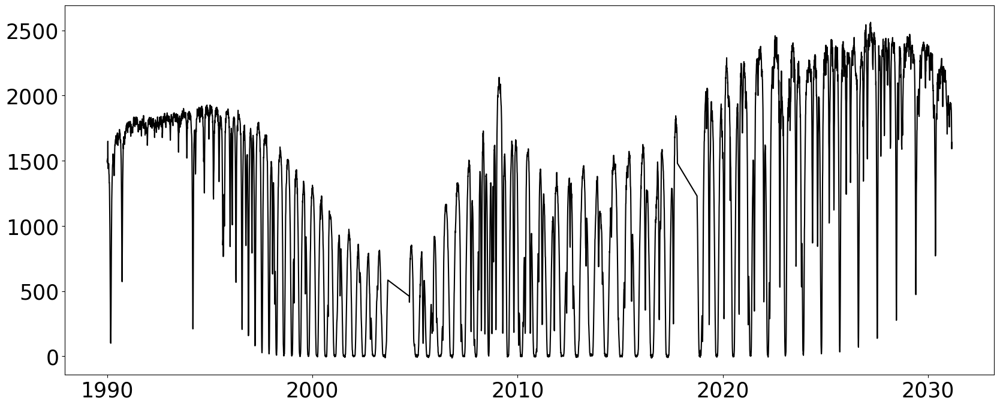

In [13]:
wave = []
flux = []

i = 5
wave.extend(frame_WL[frame][i][4:-4])
flux.extend(frame_spec[frame][i][4:-4])
i = 11
wave.extend(frame_WL[frame][i][4:-4])
flux.extend(frame_spec[frame][i][4:-4])
i = 17
wave.extend(frame_WL[frame][i][3:-4])
flux.extend(frame_spec[frame][i][3:-4])

print(len(wave))

wave = np.array(wave)
flux = np.array(flux)

plt.plot(wave,flux,'k')

[-8.95422254e-08  3.38027873e-04 -3.11239083e-01]


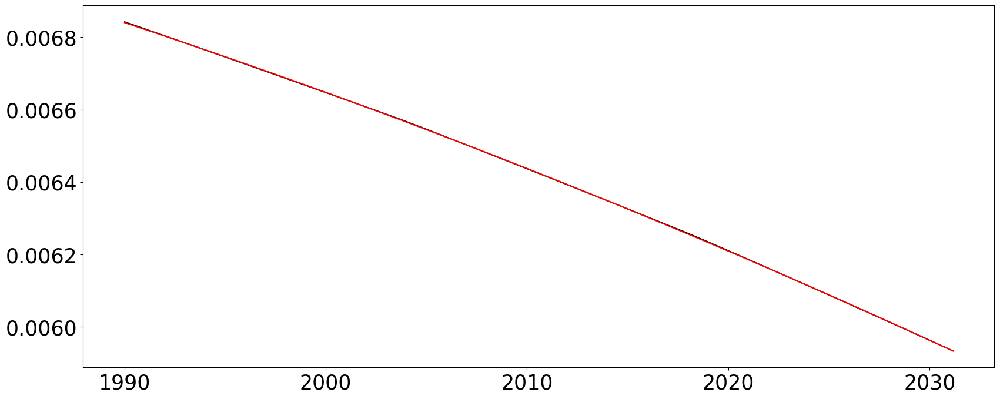

In [14]:
#wave = np.array(wave)
#print(wave[:-1]- wave[1:])
#plt.plot(wave[:-1]- wave[1:])
temp_delta = []
temp_wave = []

i = 5
test1 = np.array(frame_WL[frame][i][4:-4])
temp_delta.extend(test1[1:]- test1[:-1])
temp_wave.extend(test1[1:])
#plt.plot(test1[1:], test1[1:]- test1[:-1])

i = 11
test1 = np.array(frame_WL[frame][i][4:-4])
temp_delta.extend(test1[1:]- test1[:-1])
temp_wave.extend(test1[1:])
#plt.plot(test1[1:], test1[1:]- test1[:-1])

i = 17
test1 = np.array(frame_WL[frame][i][3:-4])
temp_delta.extend(test1[1:]- test1[:-1])
temp_wave.extend(test1[1:])
#plt.plot(test1[1:], test1[1:]- test1[:-1])

plt.plot(temp_wave, temp_delta, '-k')

p = np.polyfit(temp_wave, temp_delta, 2)
temp_wave_p = np.arange(temp_wave[0], temp_wave[-1], 100)
print(p)
c  = np.polyval(p, temp_wave)
plt.plot(temp_wave, c, 'r-')

6121
6432


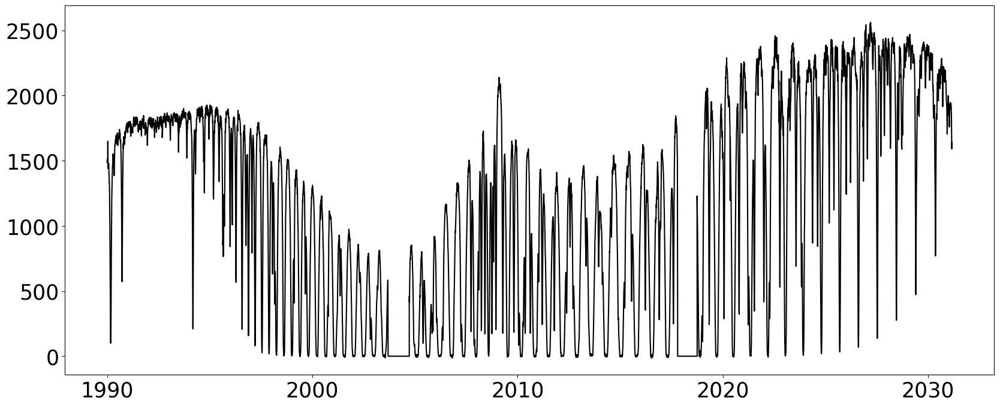

In [15]:
wave_nogape = []
flux_nogape = []

i = 5
wave_nogape.extend(frame_WL[frame][i][4:-4])
flux_nogape.extend(frame_spec[frame][i][4:-4])

star = frame_WL[frame][i][-4]
i = 11
end  = frame_WL[frame][i][4]

wave_gap = []
flux_gap = []

while(True):
    if star > end: break
    wave_gap.append(star + np.polyval(p, star))
    flux_gap.append(0)
    star += np.polyval(p, star)

wave_nogape.extend(wave_gap)
flux_nogape.extend(flux_gap)

wave_nogape.extend(frame_WL[frame][i][4:-4])
flux_nogape.extend(frame_spec[frame][i][4:-4])

star = frame_WL[frame][i][-4]
i = 17
end  = frame_WL[frame][i][4]

wave_gap = []
flux_gap = []

while(True):
    if star > end: break
    wave_gap.append(star + np.polyval(p, star))
    flux_gap.append(0)
    star += np.polyval(p, star)
    
wave_nogape.extend(wave_gap)
flux_nogape.extend(flux_gap)

wave_nogape.extend(frame_WL[frame][i][3:-4])
flux_nogape.extend(frame_spec[frame][i][3:-4])

print(len(wave))
print(len(wave_nogape))

wave_nogape = np.array(wave_nogape)
flux_nogape = np.array(flux_nogape)

plt.plot(wave_nogape,flux_nogape,'k')

[1.02244746e-01 2.13058164e+03]


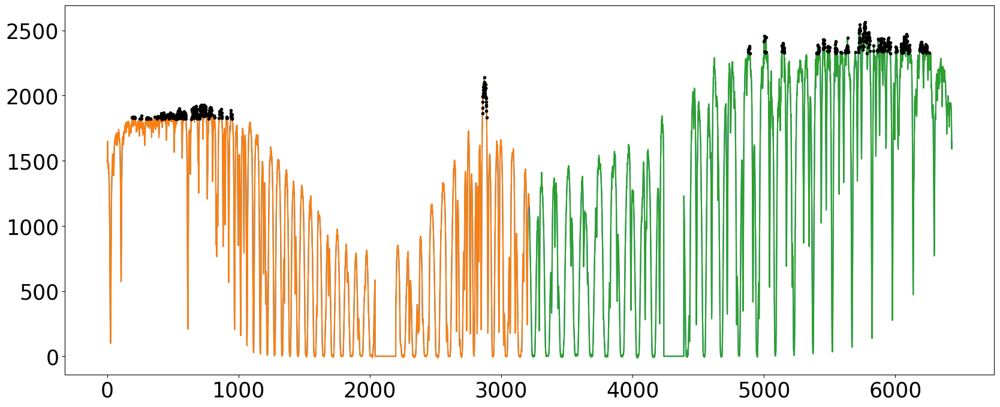

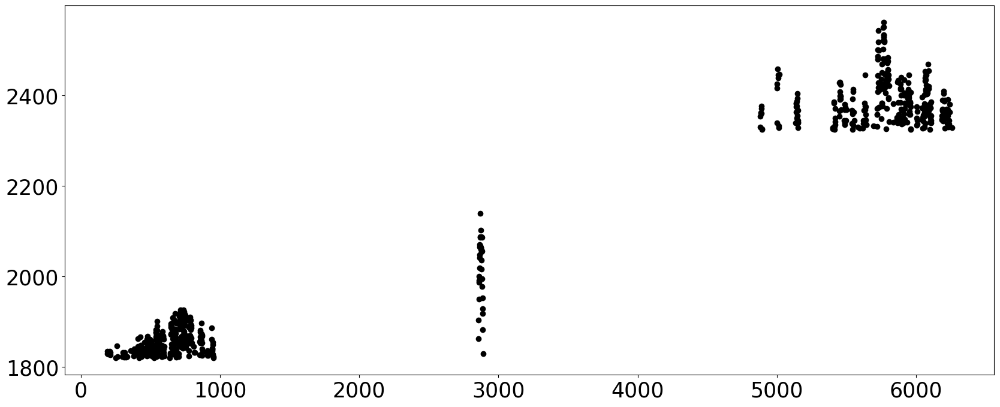

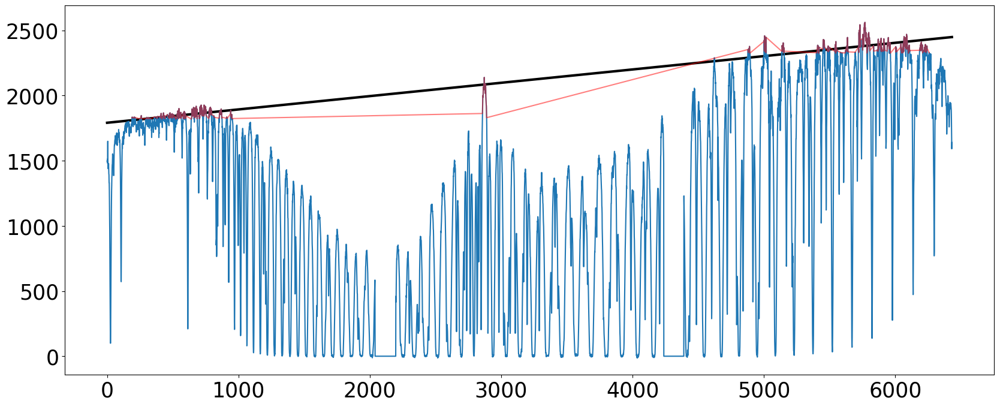

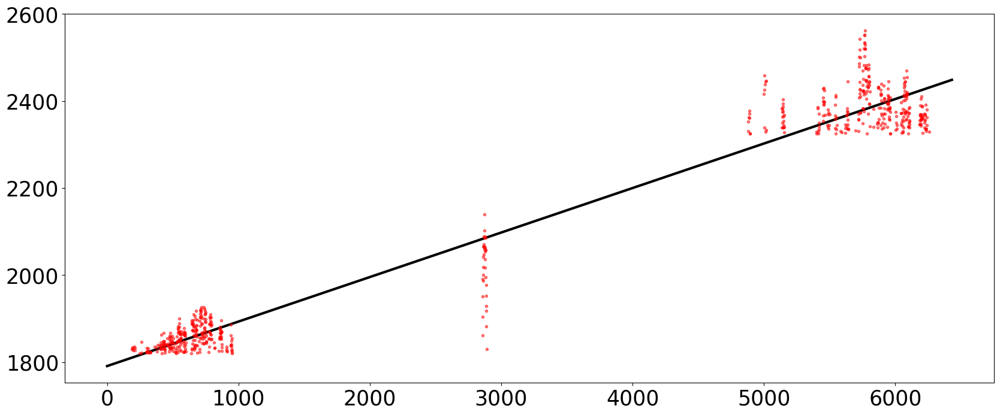

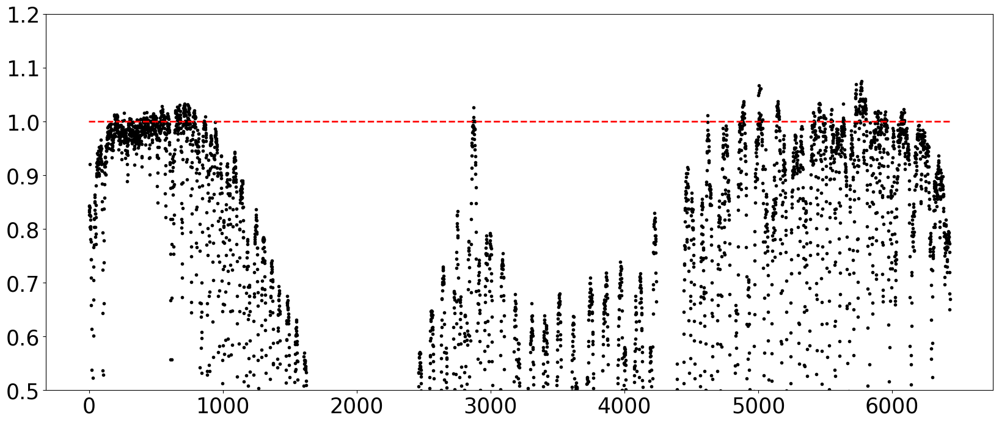

In [16]:
bins = 2
p_order = 2
fraction = 0.1
plot = True
wave_n, flux_n = Normalization(wave_nogape, flux_nogape, bins, p_order, fraction, plot, section=0)

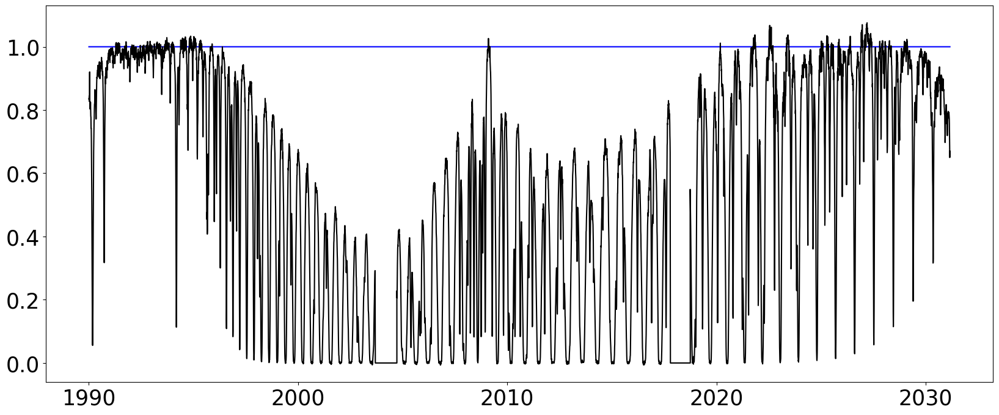

In [17]:
plt.plot(wave, np.ones_like(wave), 'b')
plt.plot(wave_n ,flux_n,'k')

full_wave_n.extend(wave_n)
full_flux_n.extend(flux_n)

# Testing Normalization part 2

2040


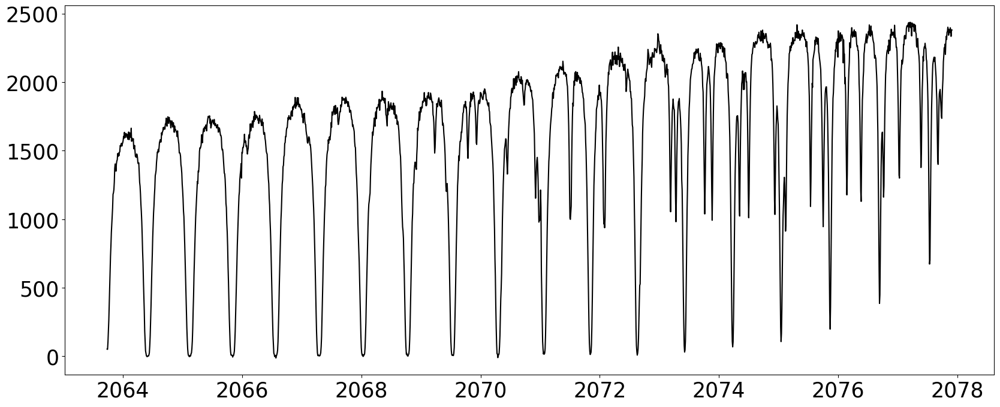

In [18]:
wave = []
flux = []

i = 4
wave.extend(frame_WL[frame][i][4:-4])
flux.extend(frame_spec[frame][i][4:-4])
#i = 10
#wave.extend(frame_WL[frame][i][4:-5])
#flux.extend(frame_spec[frame][i][4:-5])
#i = 16
#wave.extend(frame_WL[frame][i][5:-5])
#flux.extend(frame_spec[frame][i][5:-5])

print(len(wave))

wave = np.array(wave)
flux = np.array(flux)

plt.plot(wave,flux,'k')

[ 2.32237282e-16  2.39127738e-13 -4.57950604e-10 -4.33152071e-07
  1.99298281e-04  5.84905007e-01  2.04610106e+03]


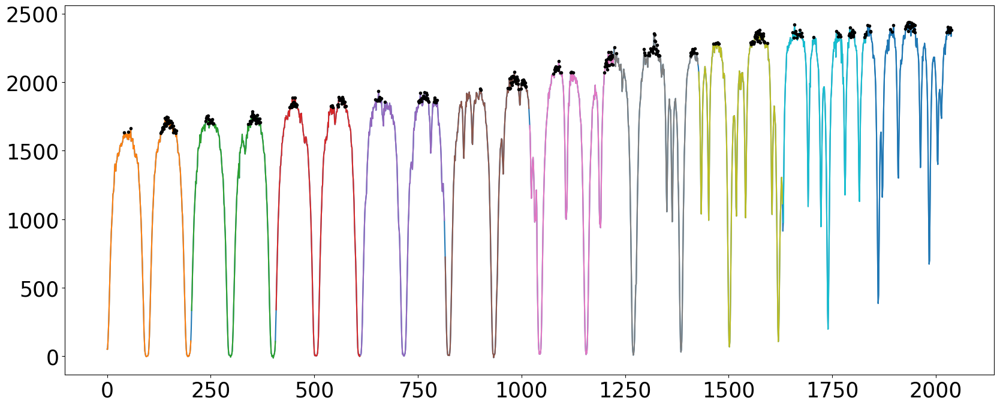

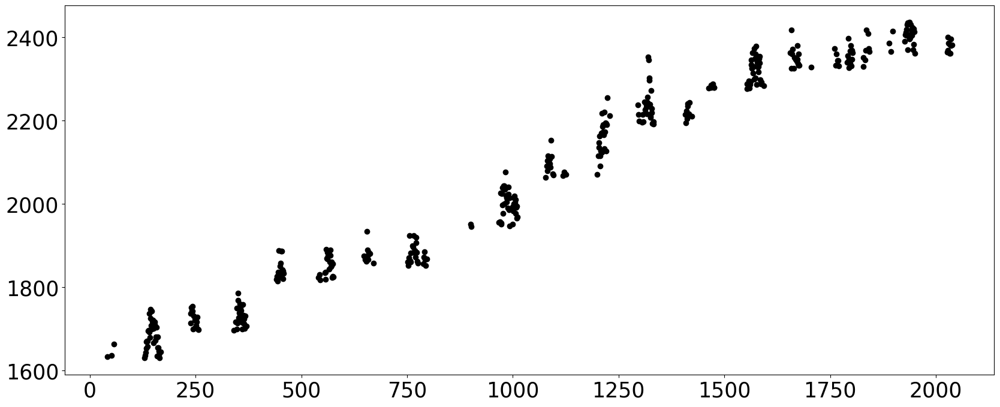

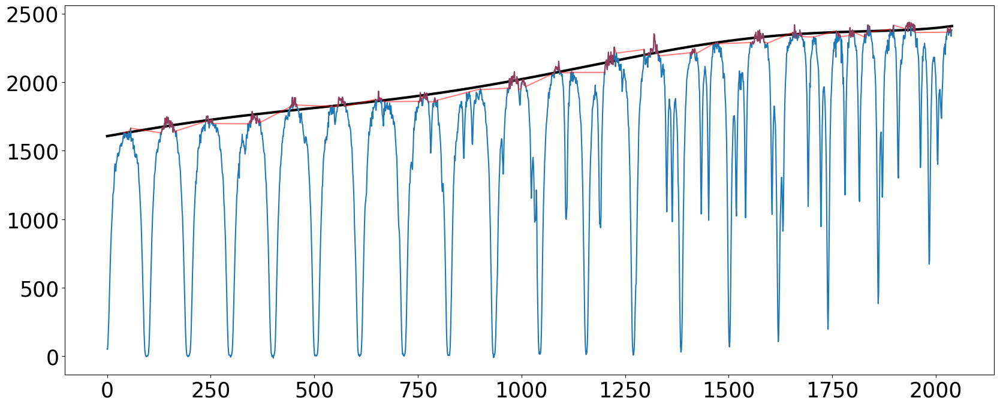

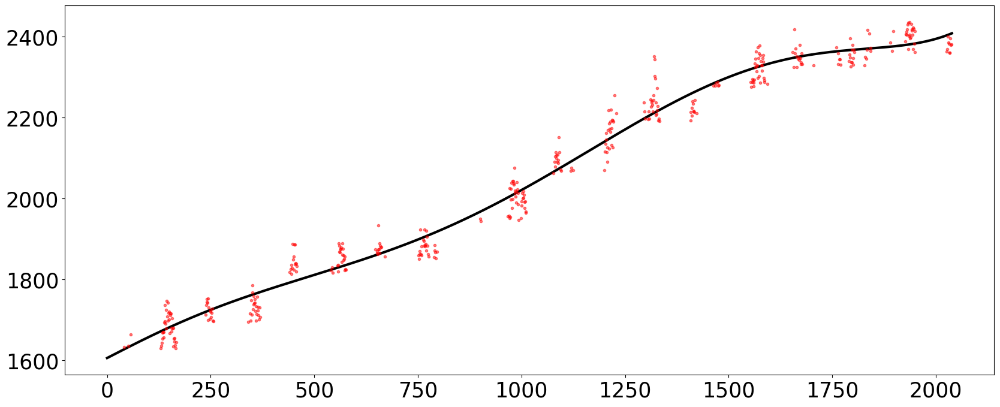

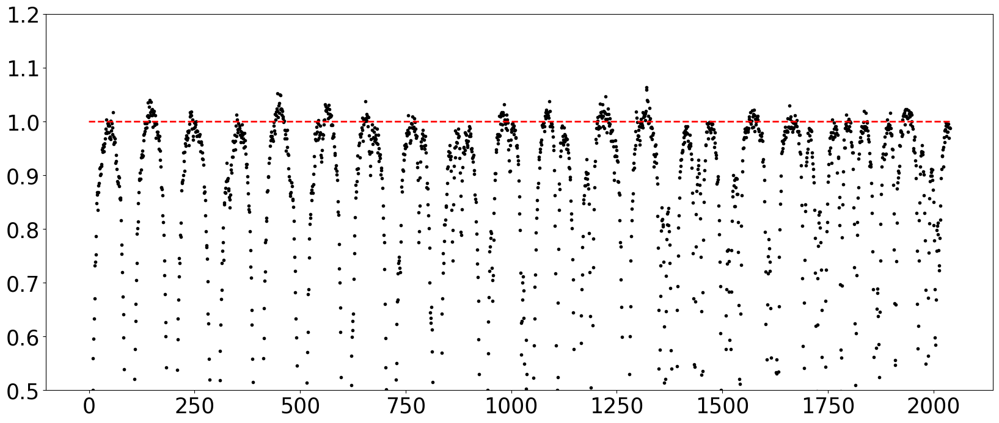

In [19]:
bins = 10
p_order = 6
fraction = 0.2
plot = True
wave_n, flux_n = Normalization(wave, flux, bins, p_order, fraction, plot, section=0)

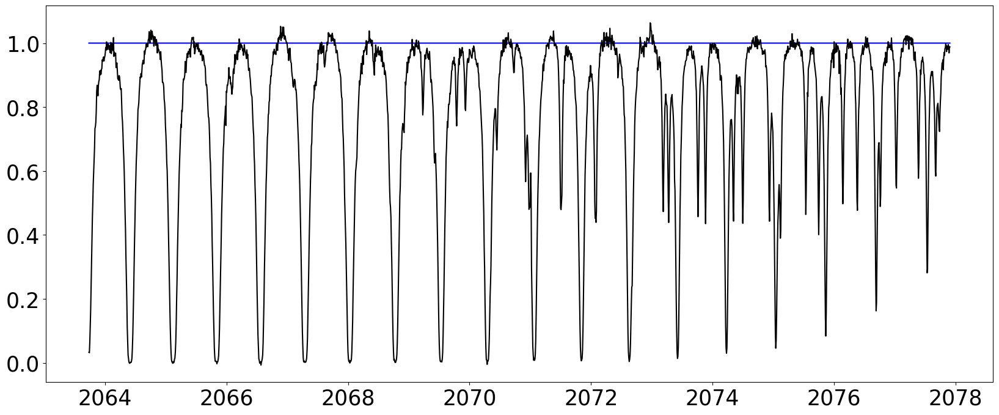

In [20]:
plt.plot(wave, np.ones_like(wave), 'b')
plt.plot(wave_n ,flux_n,'k')
full_wave_n.extend(wave_n)
full_flux_n.extend(flux_n)

4077


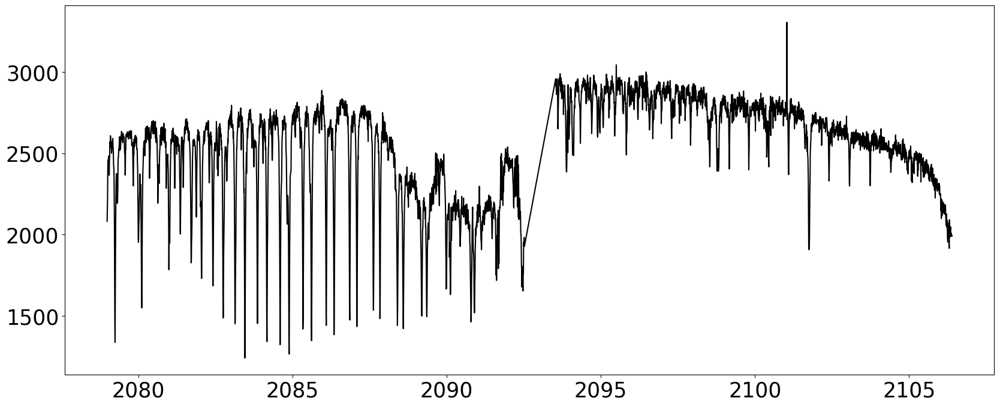

In [21]:
wave_temp = []
flux_temp = []

i = 10
wave_temp.extend(frame_WL[frame][i][4:-5])
flux_temp.extend(frame_spec[frame][i][4:-5])
i = 16
wave_temp.extend(frame_WL[frame][i][5:-5])
flux_temp.extend(frame_spec[frame][i][5:-5])

print(len(wave_temp))

wave_temp = np.array(wave_temp)
flux_temp = np.array(flux_temp)

plt.plot(wave_temp, flux_temp,'k')

[-8.66536828e-08  3.39340690e-04 -3.24162400e-01]


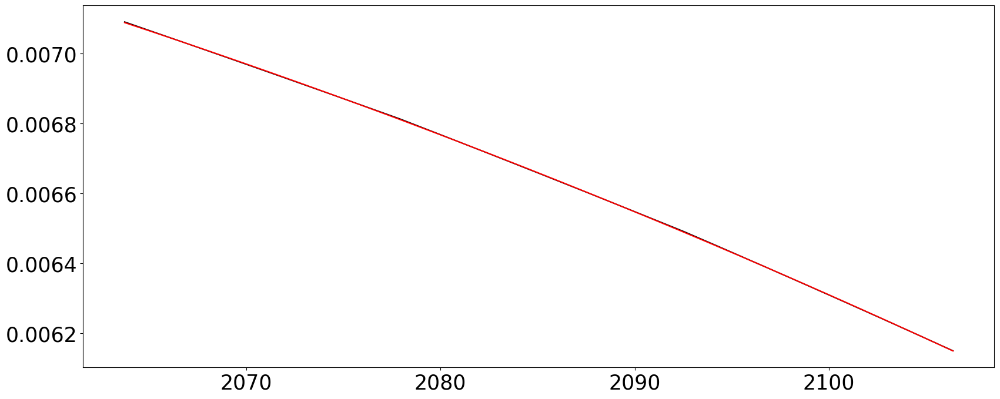

In [22]:
temp_delta = []
temp_wave = []

i = 4
test1 = np.array(frame_WL[frame][i][4:-4])
temp_delta.extend(test1[1:]- test1[:-1])
temp_wave.extend(test1[1:])

i = 10
test1 = np.array(frame_WL[frame][i][4:-5])
temp_delta.extend(test1[1:]- test1[:-1])
temp_wave.extend(test1[1:])

i = 16
test1 = np.array(frame_WL[frame][i][5:-5])
temp_delta.extend(test1[1:]- test1[:-1])
temp_wave.extend(test1[1:])

plt.plot(temp_wave, temp_delta, '-k')

p = np.polyfit(temp_wave, temp_delta, 2)
temp_wave_p = np.arange(temp_wave[0], temp_wave[-1], 100)
print(p)
c  = np.polyval(p, temp_wave)
plt.plot(temp_wave, c, 'r-')

2040
4233


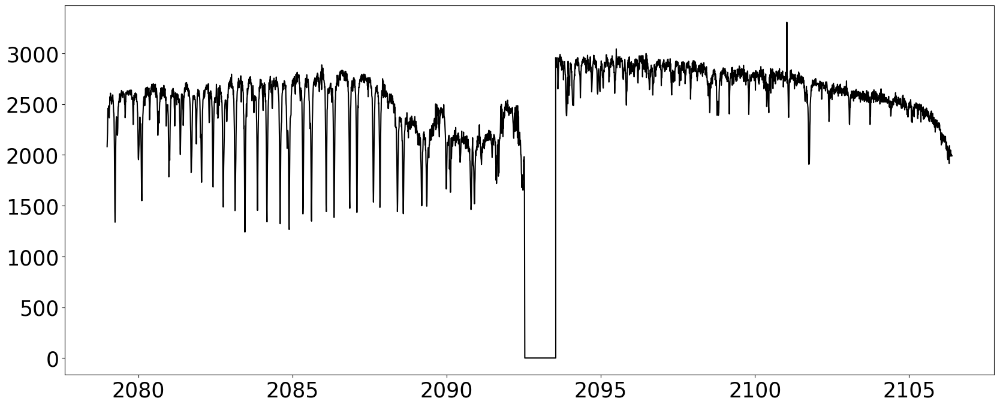

In [23]:
wave_nogape = []
flux_nogape = []

i = 10

wave_nogape.extend(frame_WL[frame][i][4:-5])
flux_nogape.extend(frame_spec[frame][i][4:-5])

star = frame_WL[frame][i][-5]
i = 16
end  = frame_WL[frame][i][5]

wave_gap = []
flux_gap = []

while(True):
    if star > end: break
    wave_gap.append(star + np.polyval(p, star))
    flux_gap.append(0)
    star += np.polyval(p, star)
    
wave_nogape.extend(wave_gap)
flux_nogape.extend(flux_gap)

wave_nogape.extend(frame_WL[frame][i][5:-5])
flux_nogape.extend(frame_spec[frame][i][5:-5])

print(len(wave))
print(len(wave_nogape))

wave_nogape = np.array(wave_nogape)
flux_nogape = np.array(flux_nogape)

plt.plot(wave_nogape,flux_nogape,'k')

[-3.86947022e-08 -8.78067454e-05  9.31169981e-02  2.88097273e+03]


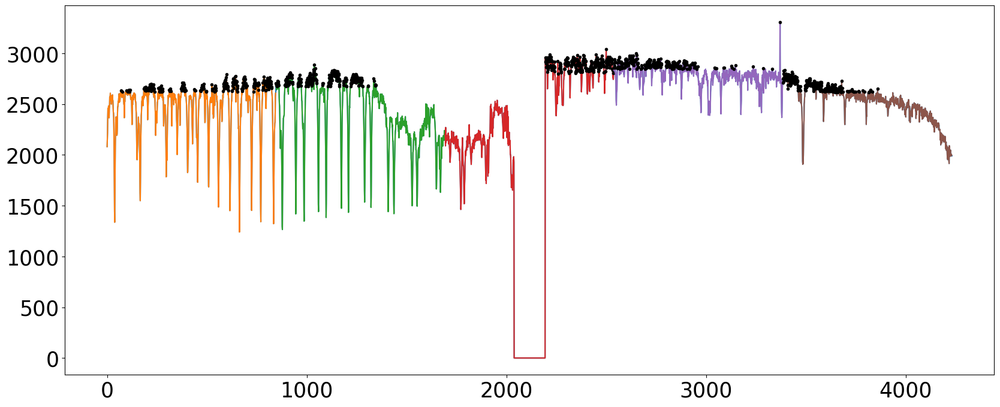

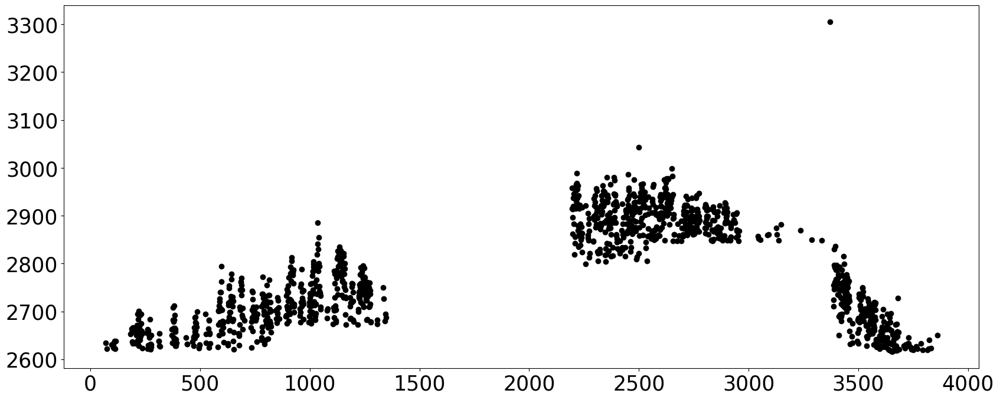

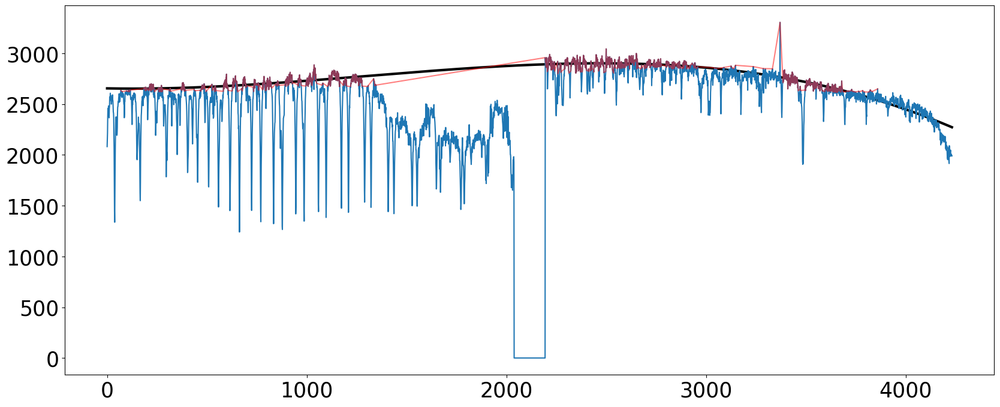

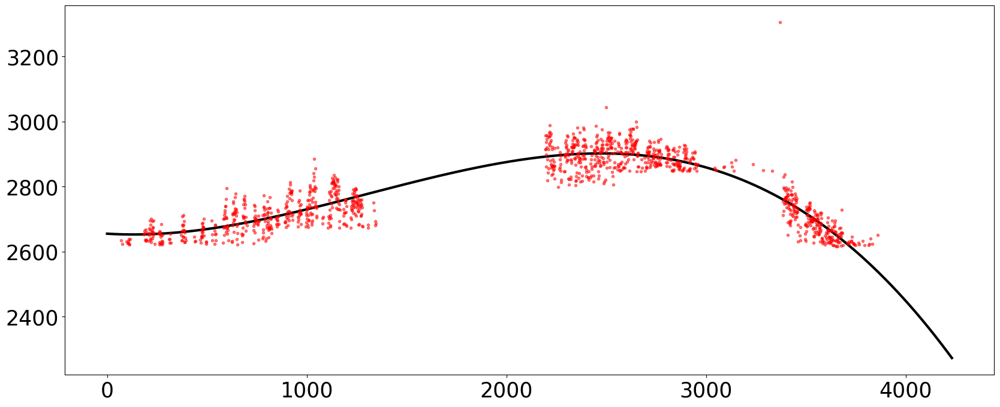

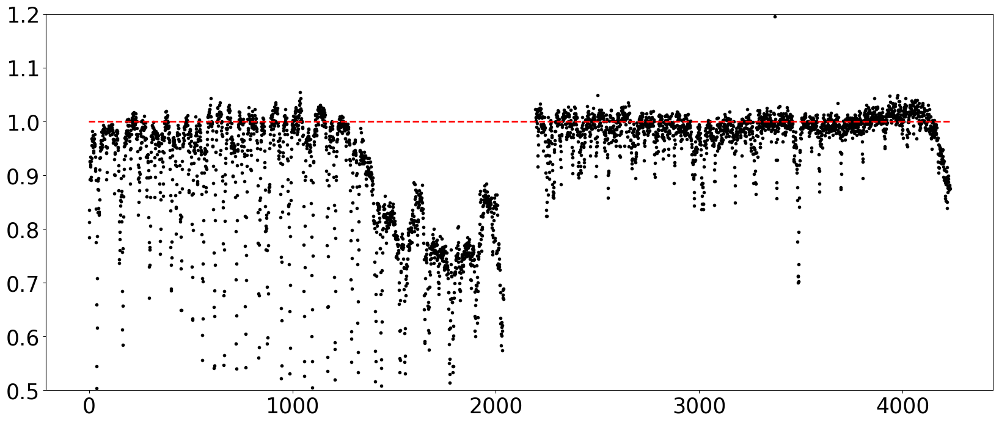

In [24]:
bins = 5
p_order = 3
fraction = 0.3
plot = True
wave_nt, flux_nt = Normalization(wave_nogape, flux_nogape, bins, p_order, fraction, plot, section=0)

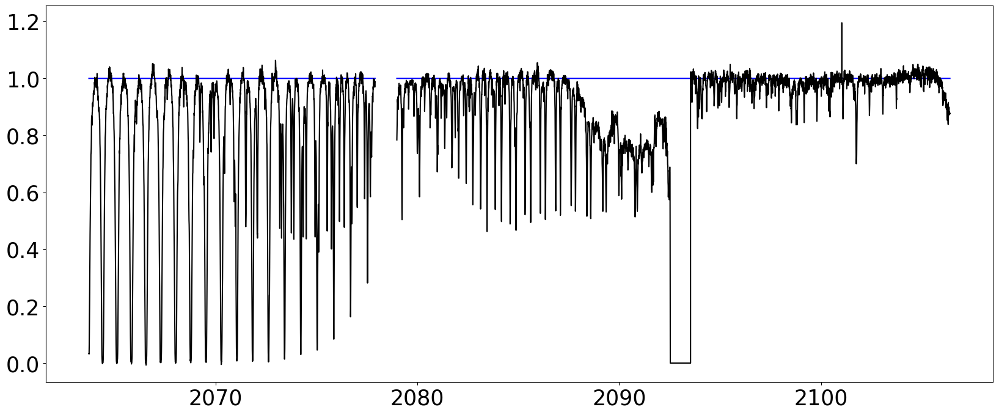

In [25]:
plt.plot(wave_temp, np.ones_like(wave_temp), 'b')
plt.plot(wave_n,np.ones_like(wave_n), 'b')
plt.plot(wave_nt ,flux_nt,'k')
plt.plot(wave_n, flux_n, 'k')
full_wave_n.extend(wave_nt)
full_flux_n.extend(flux_nt)

2039


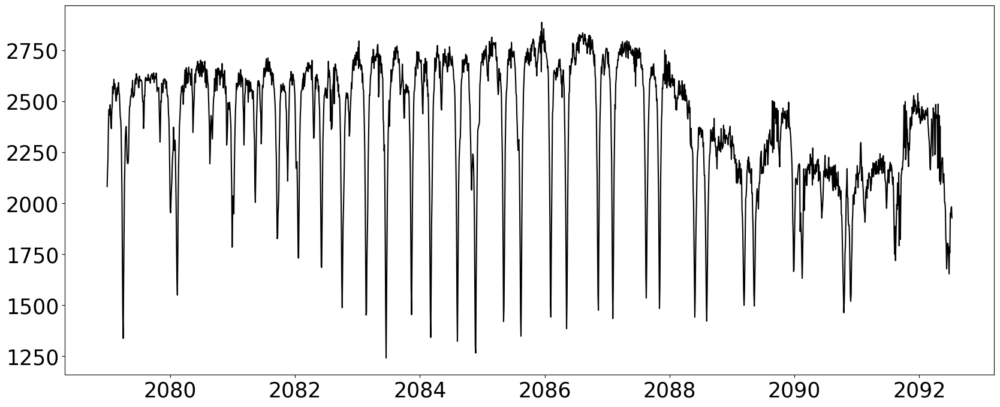

In [26]:
wave = []
flux = []

i = 10
wave.extend(frame_WL[frame][i][4:-5])
flux.extend(frame_spec[frame][i][4:-5])
#i = 16
#wave.extend(frame_WL[frame][i][5:-5])
#flux.extend(frame_spec[frame][i][5:-5])

print(len(wave))

wave = np.array(wave)
flux = np.array(flux)

plt.plot(wave,flux,'k')

[-2.93854118e-04 -9.22713721e-02  2.77313573e+03]


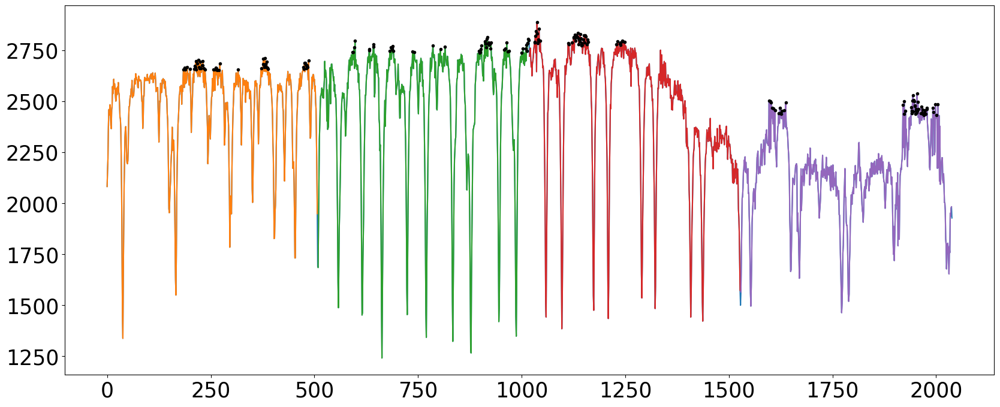

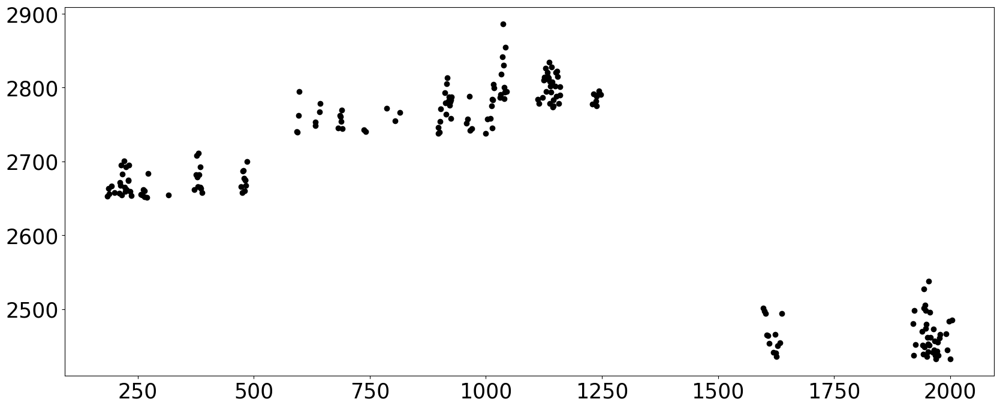

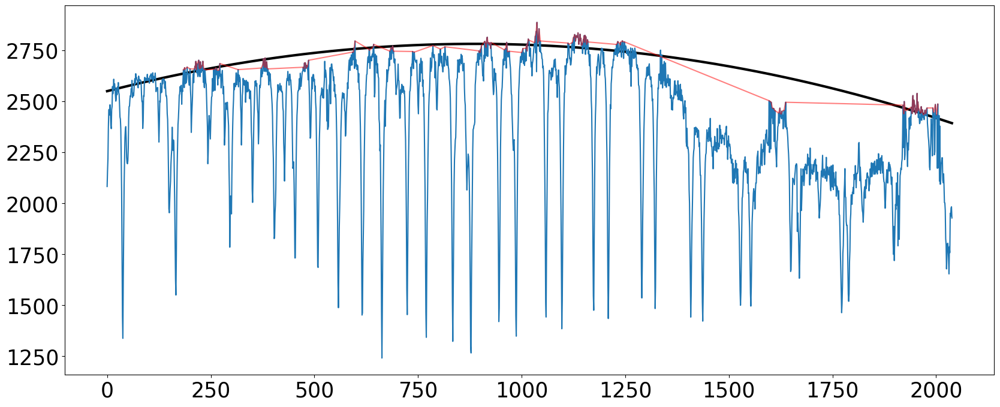

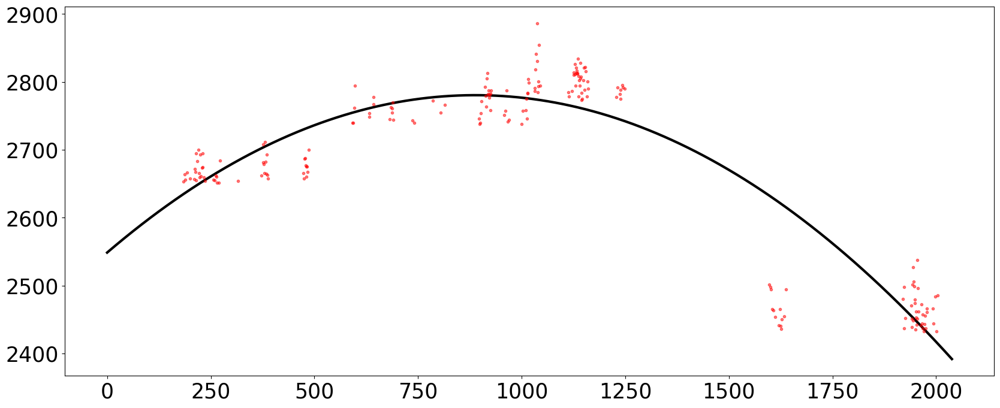

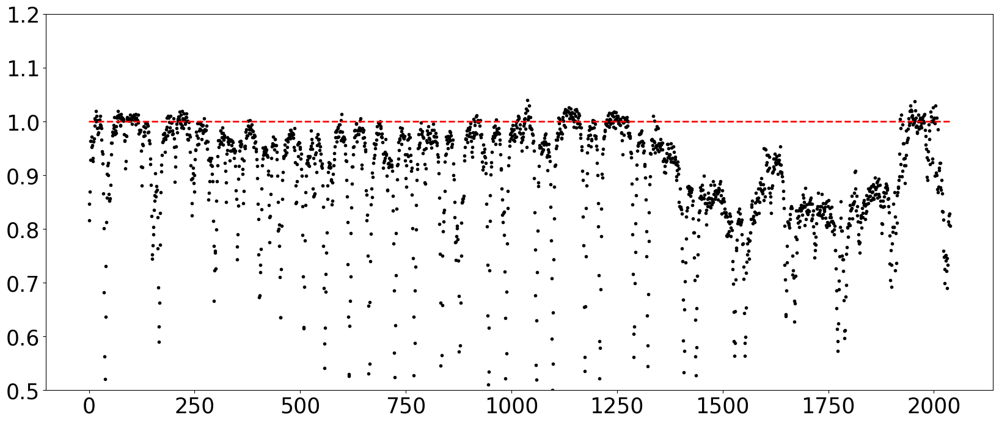

In [27]:
bins = 4
p_order = 2
fraction = 0.1
plot = True
wave_n, flux_n = Normalization(wave, flux, bins, p_order, fraction, plot, section=0)

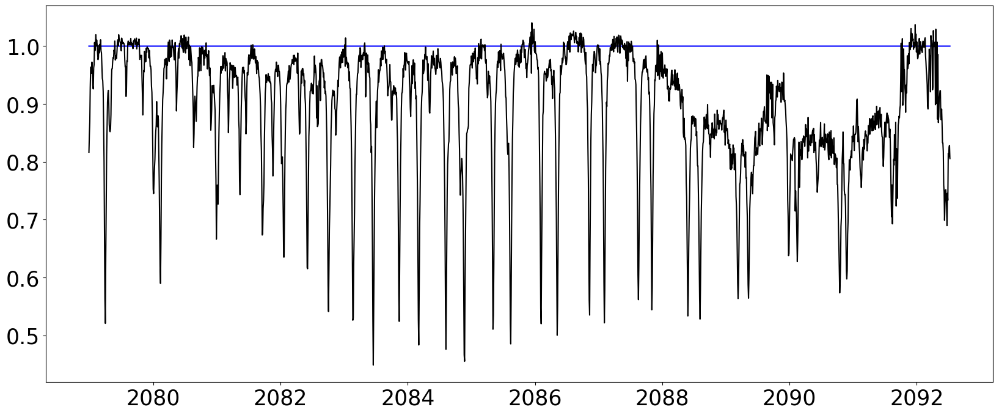

In [28]:
plt.plot(wave, np.ones_like(wave), 'b')
plt.plot(wave_n ,flux_n,'k')
#full_wave_n.extend(wave_n)
#full_flux_n.extend(flux_n)

# Testing Normalization part 3

2039


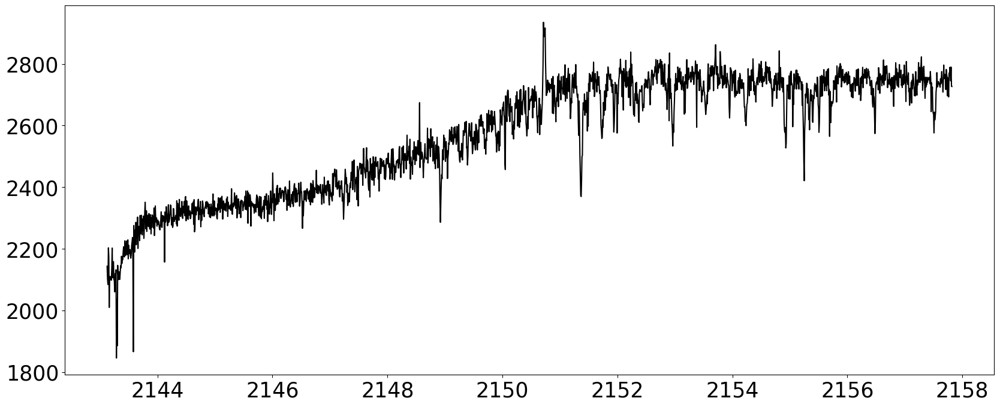

In [29]:
wave1 = []
flux1 = []

i = 3
wave1.extend(frame_WL[frame][i][5:-5])
flux1.extend(np.array(frame_spec[frame][i][5:-5]) +190)
#i = 9
#wave.extend(frame_WL[frame][i][6:-6])
#flux.extend(frame_spec[frame][i][6:-6])
#i = 15
#wave.extend(frame_WL[frame][i][6:-6])
#flux.extend(frame_spec[frame][i][6:-6])

print(len(wave))

wave1 = np.array(wave1)
flux1 = np.array(flux1)

plt.plot(wave1,flux1,'k')

[-8.39168502e-16  3.67760091e-13  1.47509122e-09 -5.82886004e-07
 -8.69655466e-04  4.83965255e-01  2.75387630e+03]


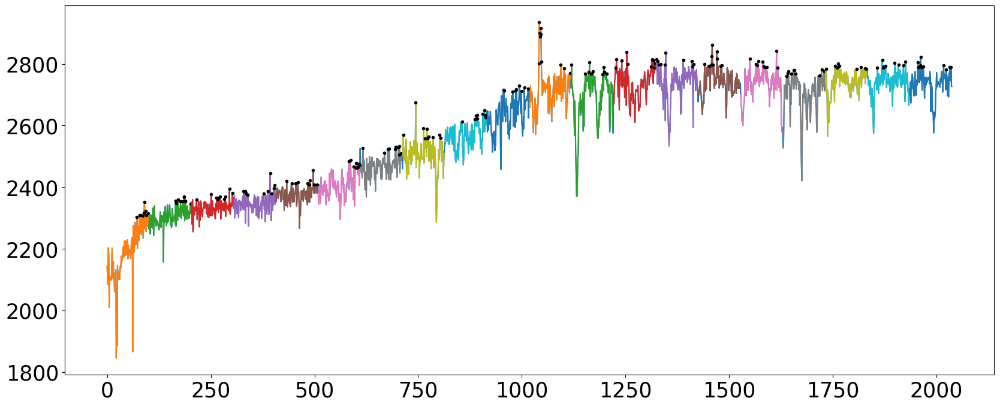

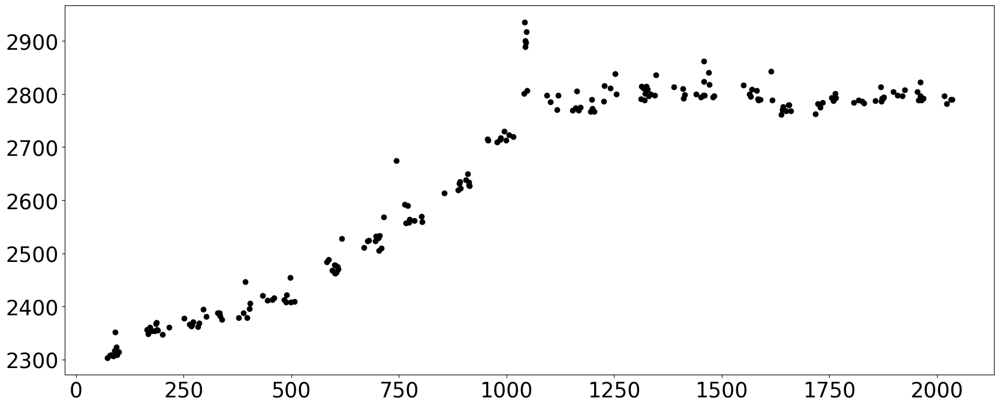

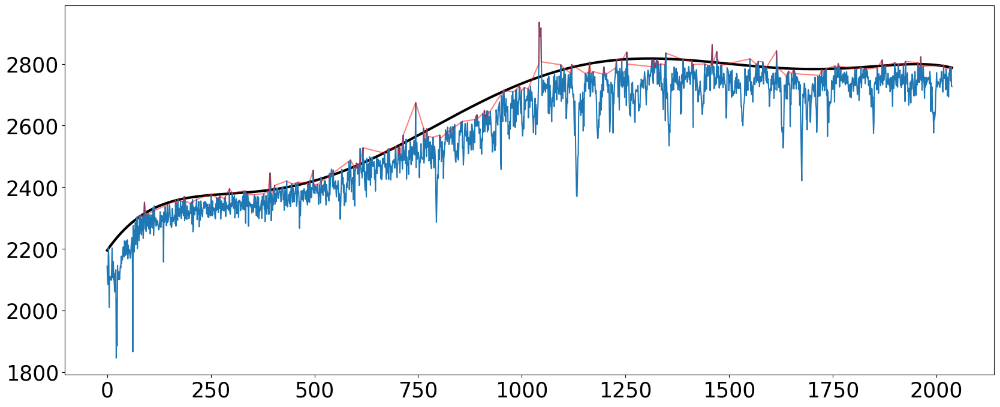

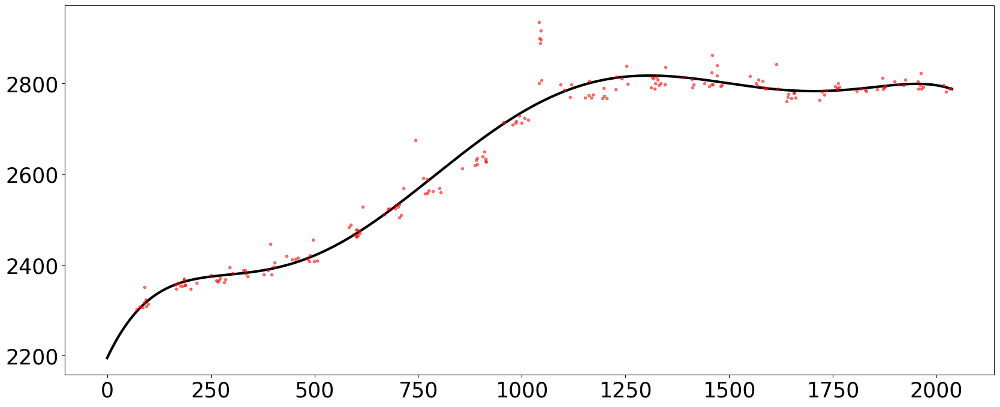

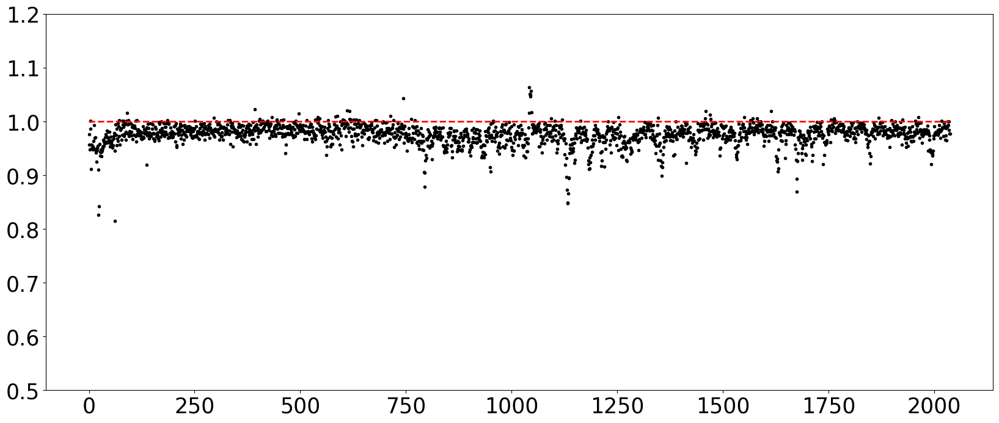

In [30]:
bins = 20
p_order = 6
fraction = 0.1
plot = True
wave_n1, flux_n1 = Normalization(wave1, flux1, bins, p_order, fraction, plot, section=0)

(0.0, 1.1)

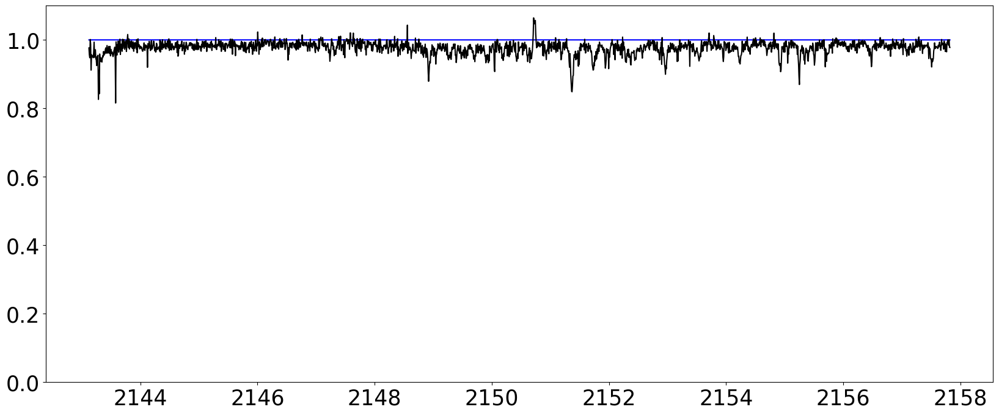

In [31]:
plt.plot(wave1, np.ones_like(wave1), 'b')
plt.plot(wave_n1 ,flux_n1,'k')
full_wave_n.extend(wave_n1)
full_flux_n.extend(flux_n1)
plt.ylim(0,1.1)

2036


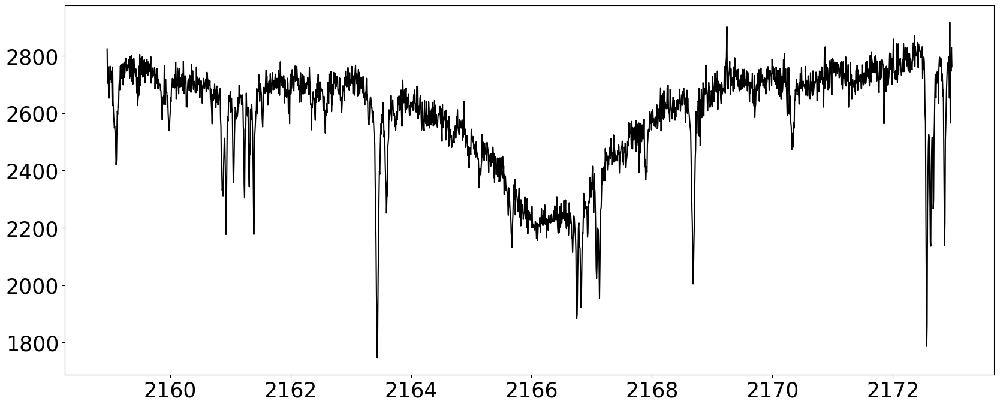

In [32]:
wave2 = []
flux2 = []

#i = 3
#wave1.extend(frame_WL[frame][i][5:-5])
#flux1.extend(np.array(frame_spec[frame][i][5:-5]) +190)
i = 9
wave2.extend(frame_WL[frame][i][6:-6])
flux2.extend(frame_spec[frame][i][6:-6])
#i = 15
#wave.extend(frame_WL[frame][i][6:-6])
#flux.extend(frame_spec[frame][i][6:-6])

print(len(wave2))

wave2 = np.array(wave2)
flux2 = np.array(flux2)

plt.plot(wave2, flux2,'k')

[2.40213065e-08 1.19936801e-04 6.93889005e-03 2.68368836e+03]


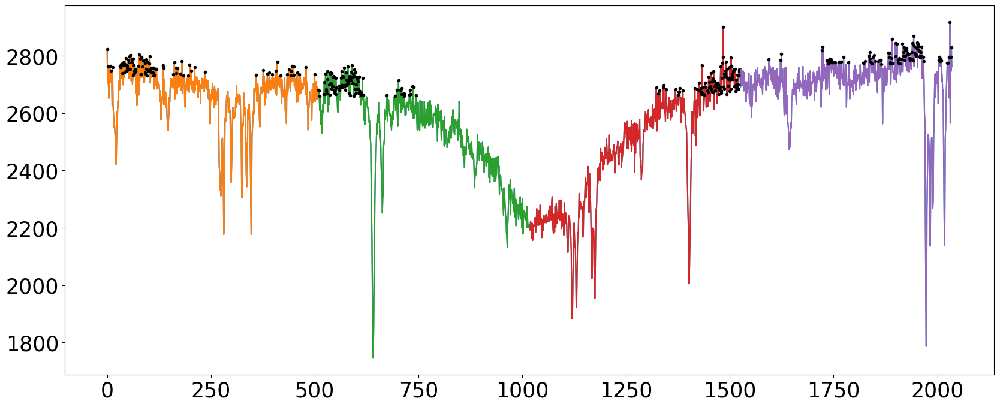

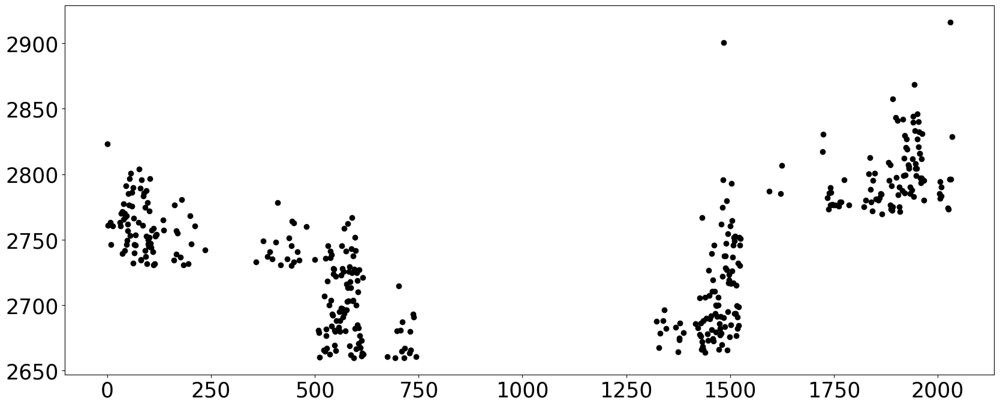

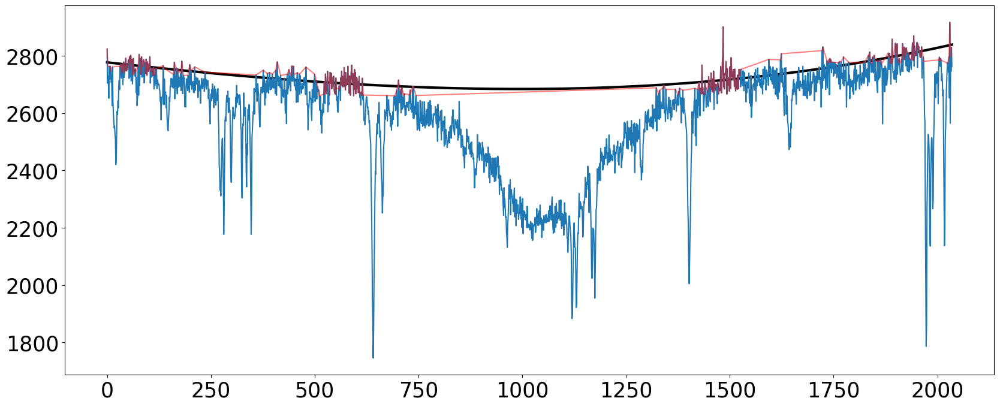

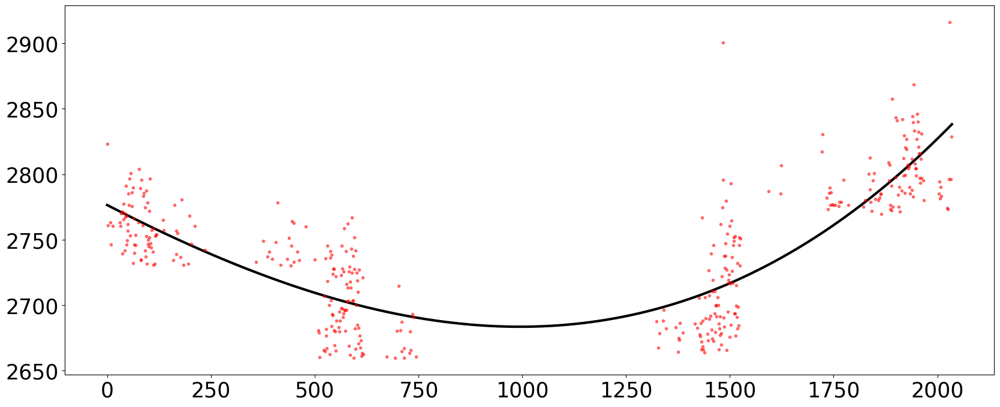

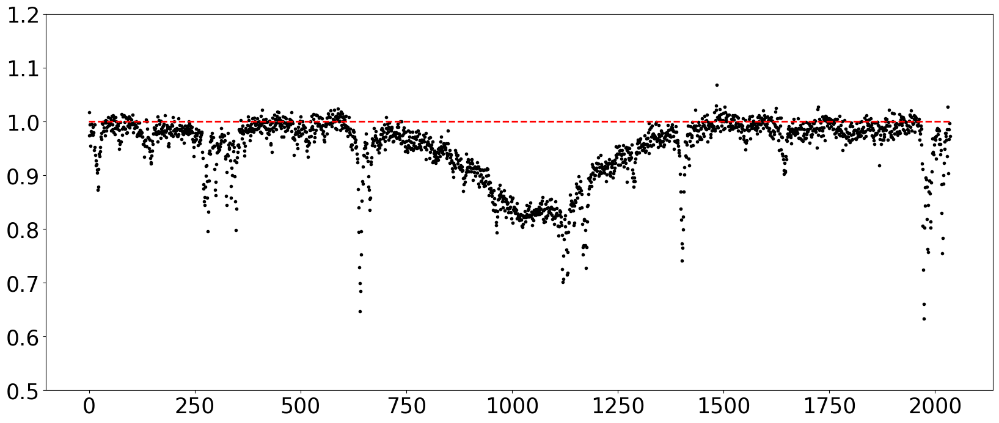

In [33]:
bins = 4
p_order = 6
fraction = 0.2
plot = True
wave_n2, flux_n2 = Normalization(wave2, flux2, bins, p_order, fraction, plot, section=0)

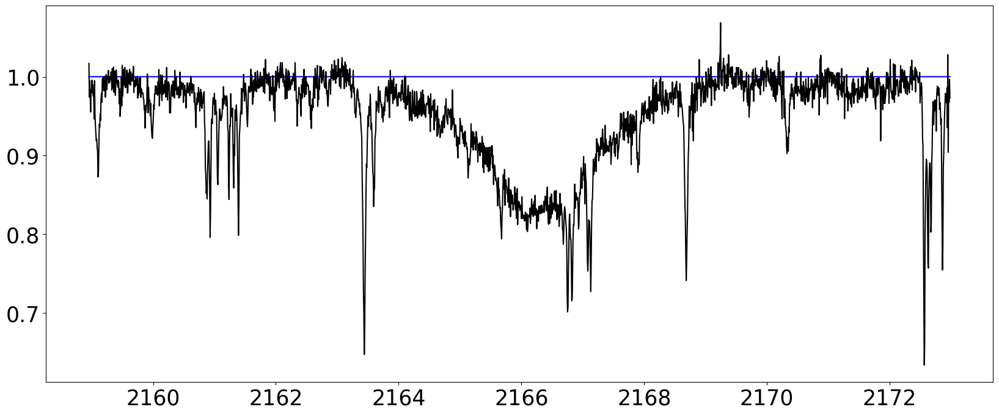

In [34]:
plt.plot(wave2, np.ones_like(wave2), 'b')
plt.plot(wave_n2 ,flux_n2,'k')
full_wave_n.extend(wave_n2)
full_flux_n.extend(flux_n2)
#plt.ylim(0,1.1)

2036


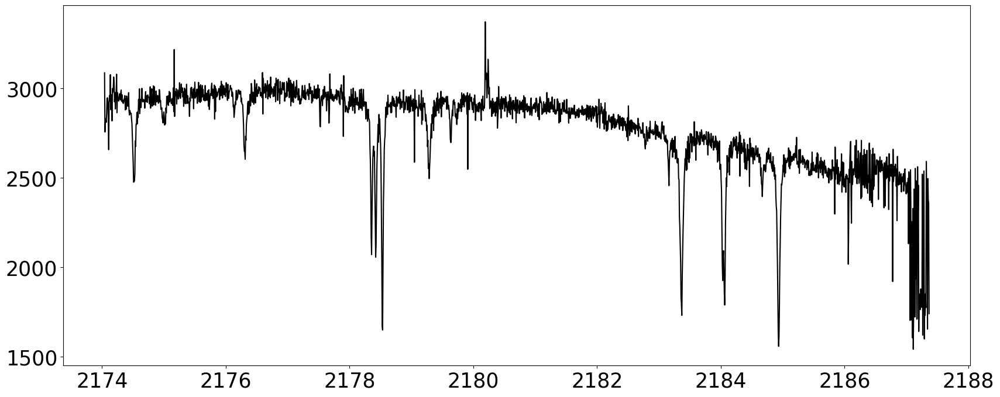

In [35]:
wave3 = []
flux3 = []

#i = 3
#wave1.extend(frame_WL[frame][i][5:-5])
#flux1.extend(np.array(frame_spec[frame][i][5:-5]) +190)
#i = 9
#wave2.extend(frame_WL[frame][i][6:-6])
#flux2.extend(frame_spec[frame][i][6:-6])
i = 15
wave3.extend(frame_WL[frame][i][6:-6])
flux3.extend(frame_spec[frame][i][6:-6])

print(len(wave2))

wave3 = np.array(wave3)
flux3 = np.array(flux3)

plt.plot(wave3, flux3,'k')

[ 9.17479289e-08 -1.73099157e-04 -2.97792879e-01  2.90370056e+03]


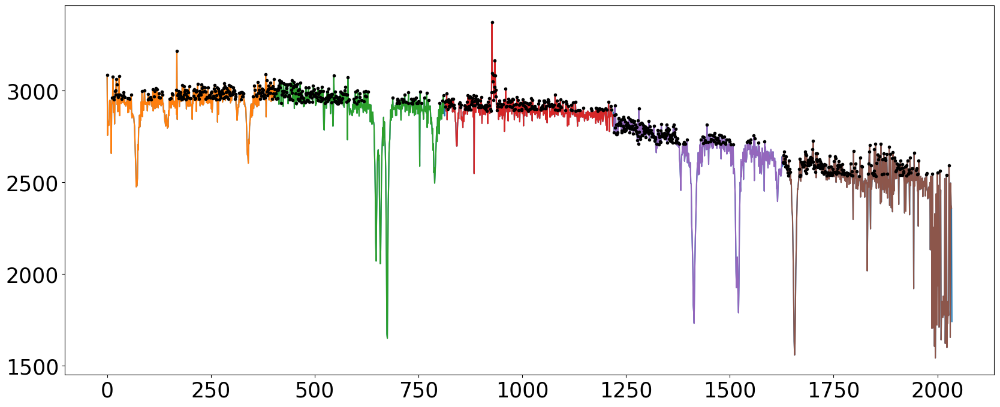

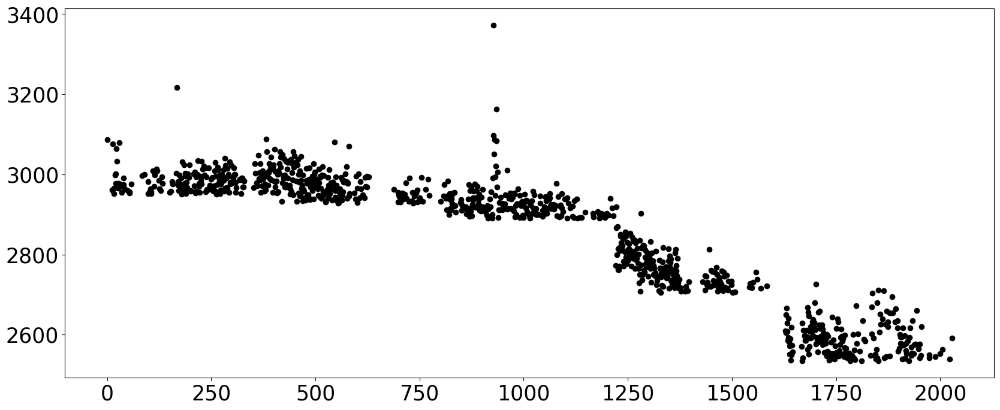

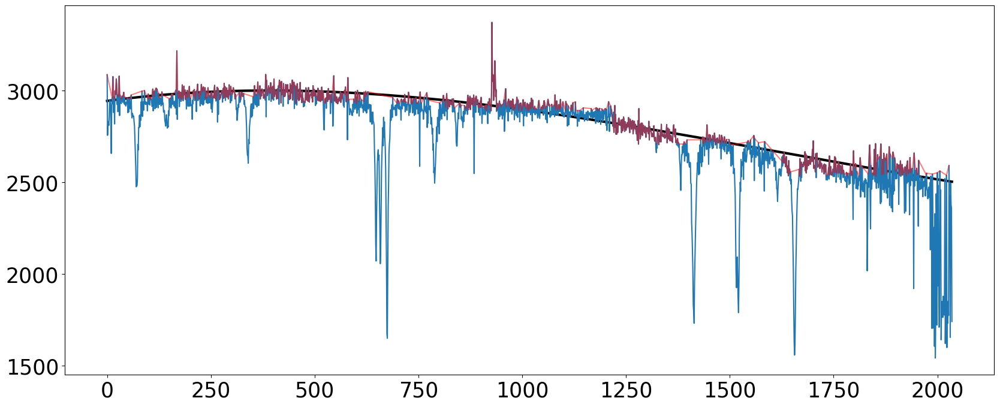

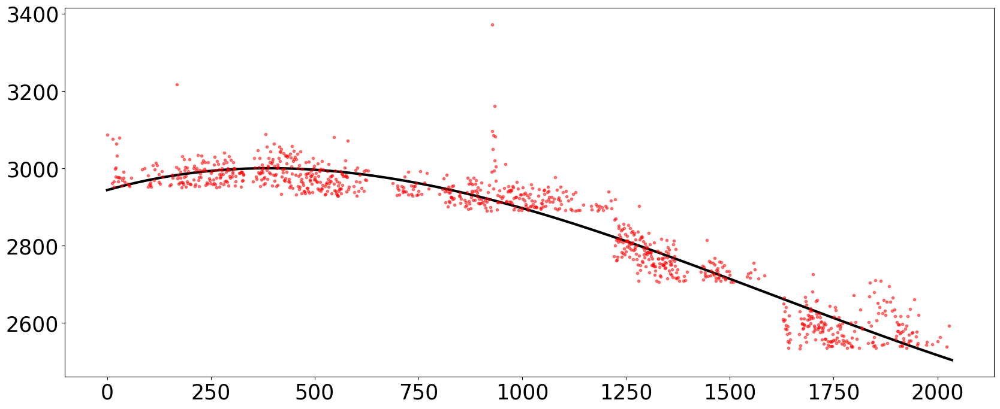

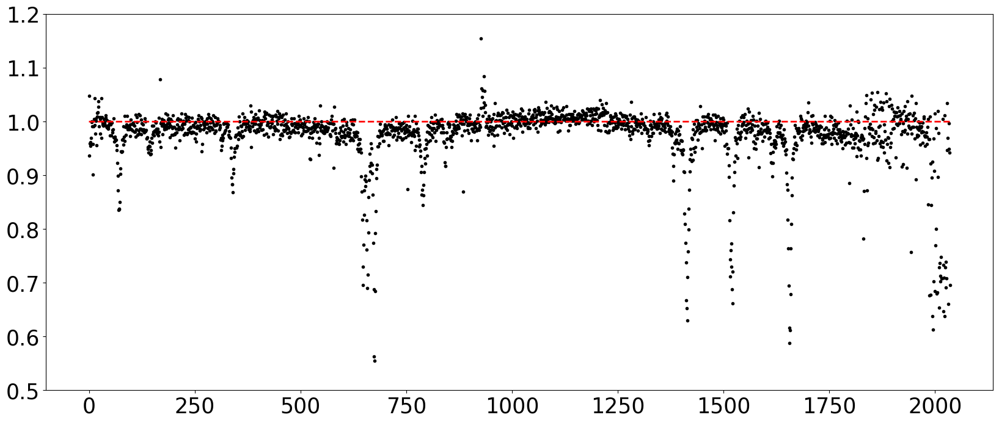

In [36]:
bins = 5
p_order = 3
fraction = 0.5
plot = True
wave_n3, flux_n3 = Normalization(wave3, flux3, bins, p_order, fraction, plot, section=0)

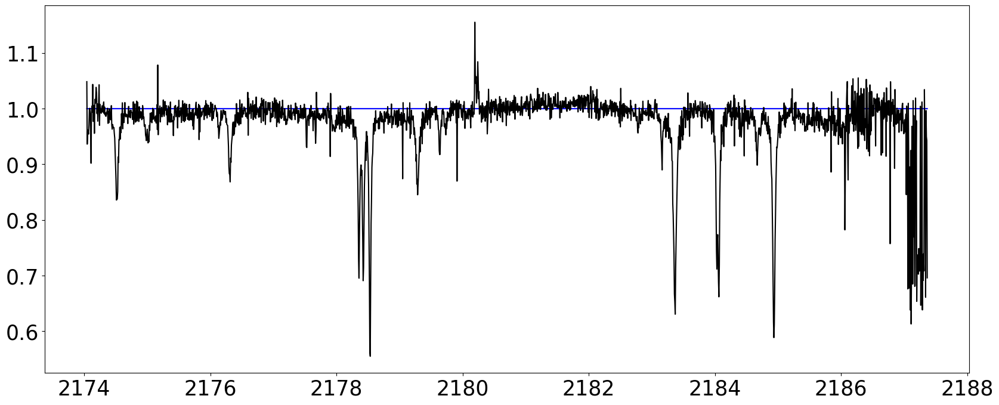

In [37]:
plt.plot(wave3, np.ones_like(wave3), 'b')
plt.plot(wave_n3 ,flux_n3,'k')
full_wave_n.extend(wave_n3)
full_flux_n.extend(flux_n3)
#plt.ylim(0,1.1)

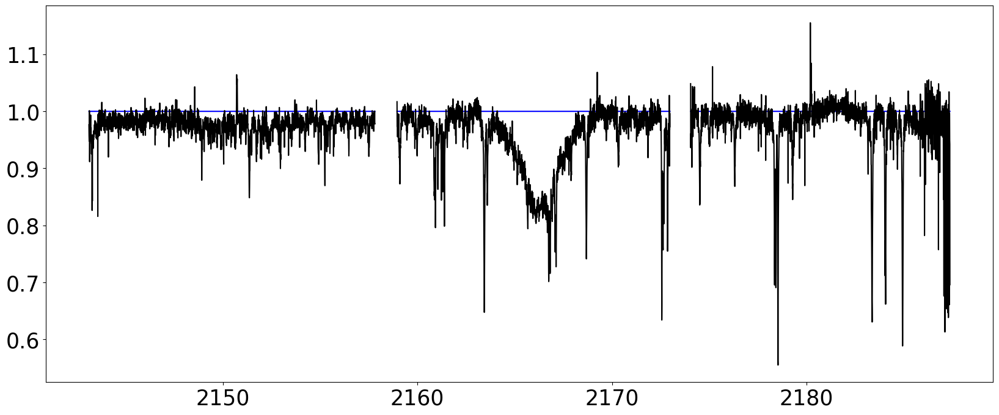

In [38]:
plt.plot(wave1, np.ones_like(wave1), 'b')
plt.plot(wave_n1 ,flux_n1,'k')
plt.plot(wave2, np.ones_like(wave2), 'b')
plt.plot(wave_n2 ,flux_n2,'k')
plt.plot(wave3, np.ones_like(wave3), 'b')
plt.plot(wave_n3 ,flux_n3,'k')
#plt.ylim(0,1.1)

# Testing Normalization part 4

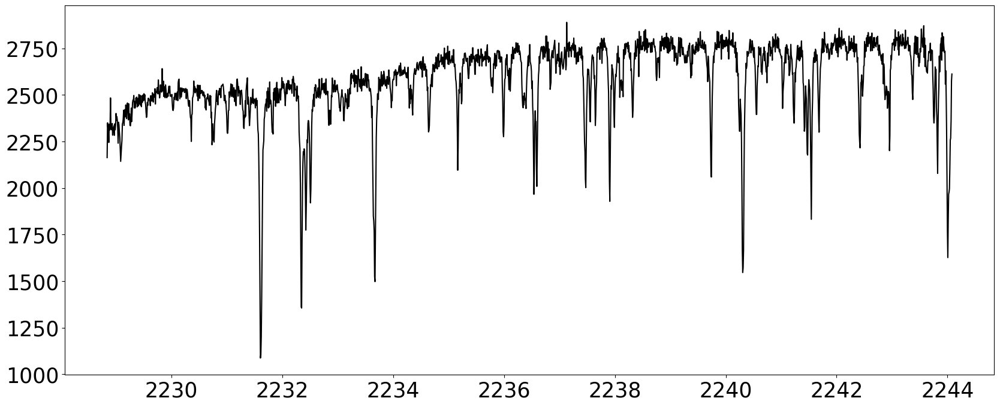

In [39]:
wave1 = []
flux1 = []

i = 2
wave1.extend(frame_WL[frame][i][7:-7])
flux1.extend(np.array(frame_spec[frame][i][7:-7])+190)
#i = 8
#wave.extend(frame_WL[frame][i][6:-7])
#flux.extend(frame_spec[frame][i][6:-7])
#i = 14
#wave.extend(frame_WL[frame][i][8:-8])
#flux.extend(frame_spec[frame][i][8:-8])

#print(len(wave))

wave1 = np.array(wave1)
flux1 = np.array(flux1)

plt.plot(wave1,flux1,'k')

[-6.56800868e-16  1.70634637e-13  1.07247246e-09 -2.53221393e-07
 -5.57630687e-04  2.54526790e-01  2.78329118e+03]


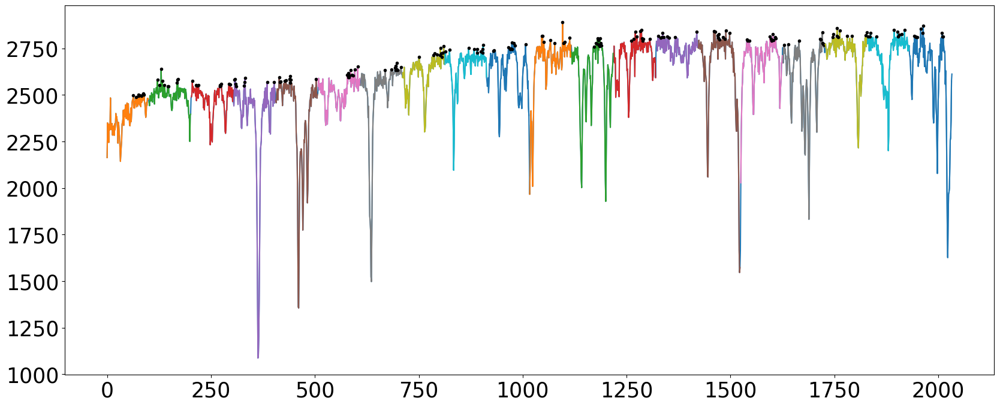

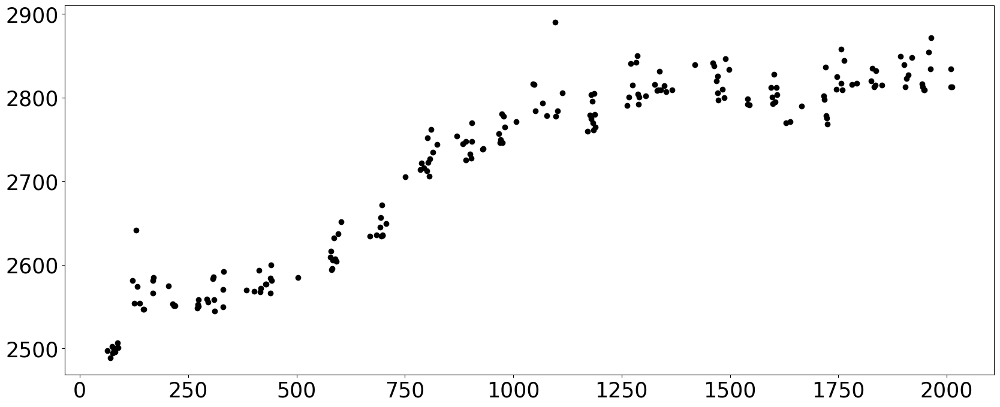

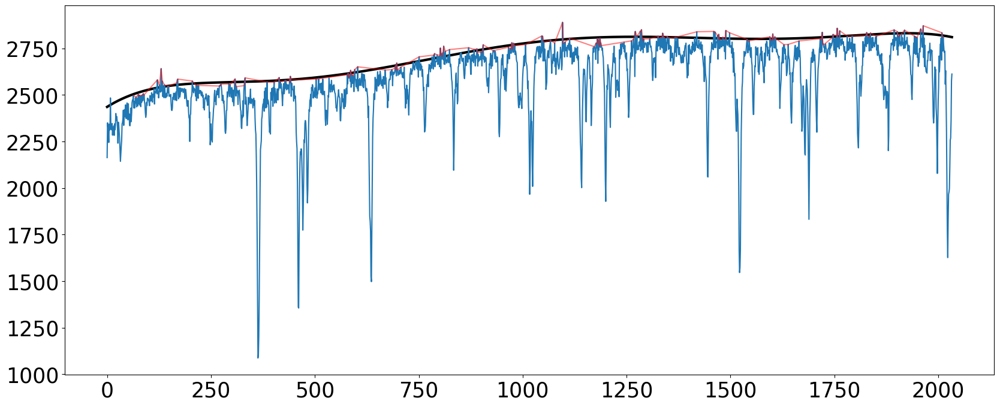

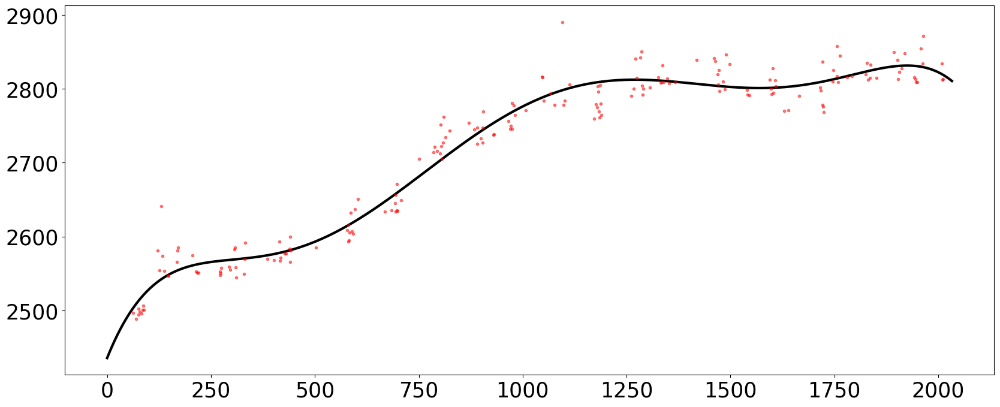

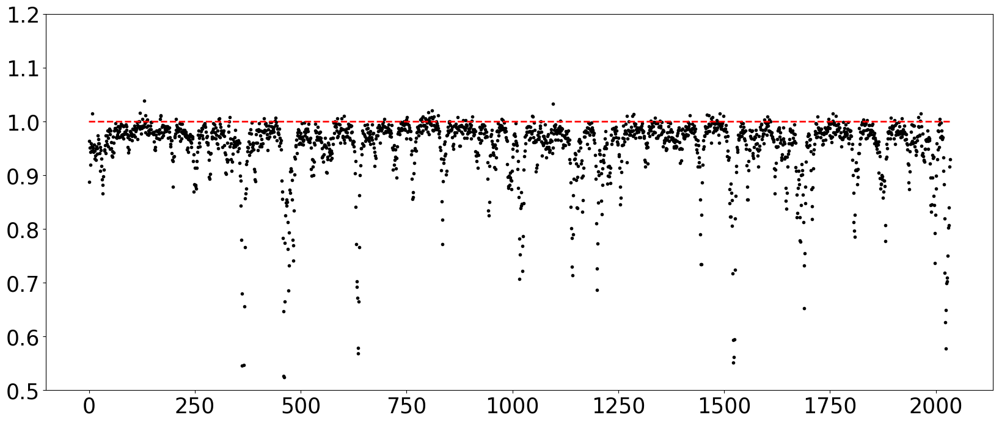

In [40]:
bins = 20
p_order = 6
fraction = 0.1
plot = True
wave_n1, flux_n1 = Normalization(wave1, flux1, bins, p_order, fraction, plot, section=0)

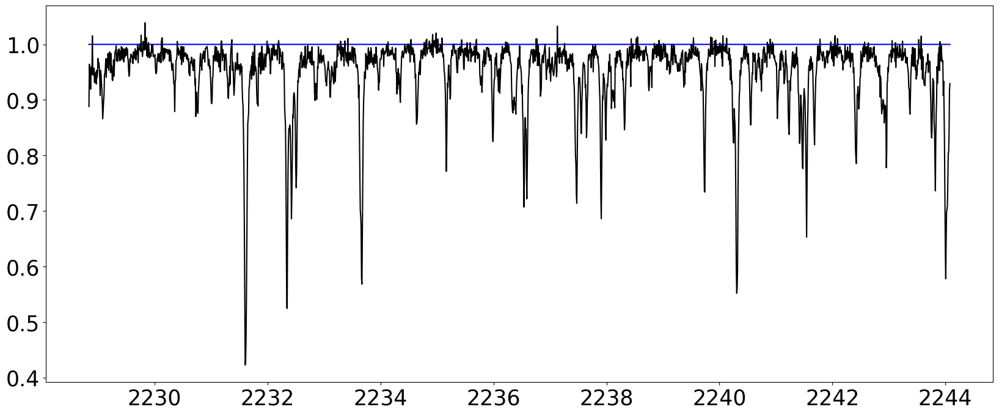

In [41]:
plt.plot(wave1, np.ones_like(wave1), 'b')
plt.plot(wave_n1 ,flux_n1,'k')
full_wave_n.extend(wave_n1)
full_flux_n.extend(flux_n1)

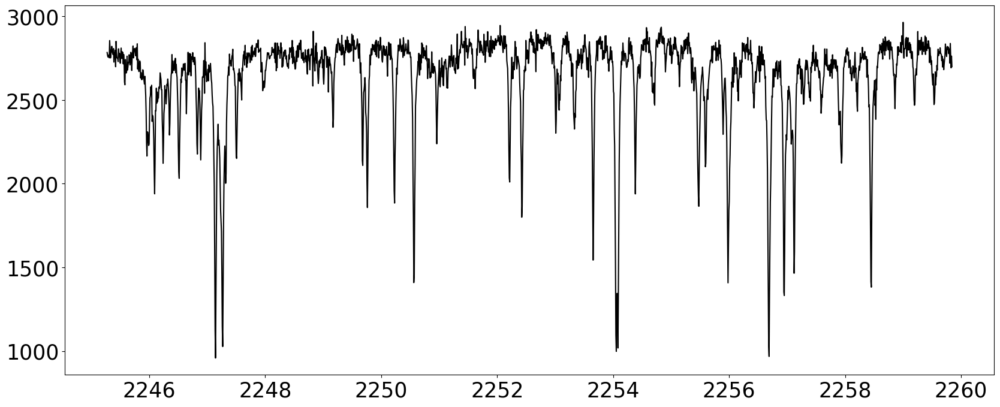

In [42]:
wave2 = []
flux2 = []

#i = 2
#wave1.extend(frame_WL[frame][i][7:-7])
#flux1.extend(np.array(frame_spec[frame][i][7:-7])+190)
i = 8
wave2.extend(frame_WL[frame][i][6:-7])
flux2.extend(frame_spec[frame][i][6:-7])
#i = 14
#wave.extend(frame_WL[frame][i][8:-8])
#flux.extend(frame_spec[frame][i][8:-8])

#print(len(wave))

wave2 = np.array(wave2)
flux2 = np.array(flux2)

plt.plot(wave2,flux2,'k')

[ 6.03391293e-08 -7.30424573e-05 -1.99313934e-02  2.83703489e+03]


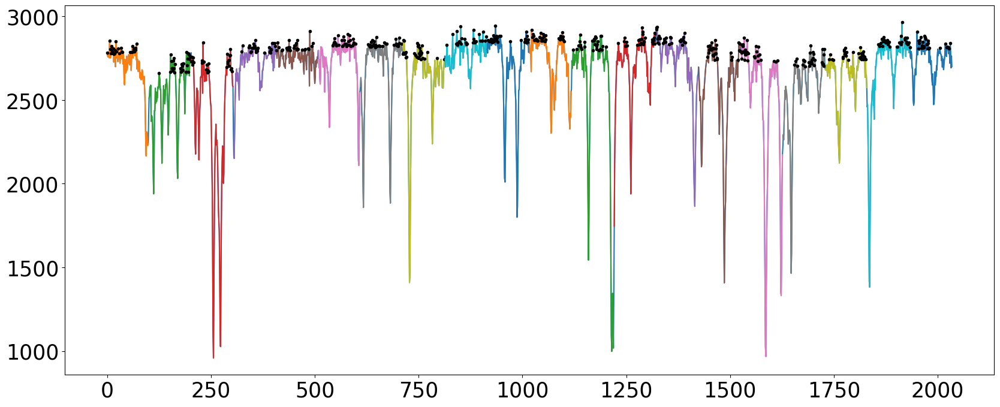

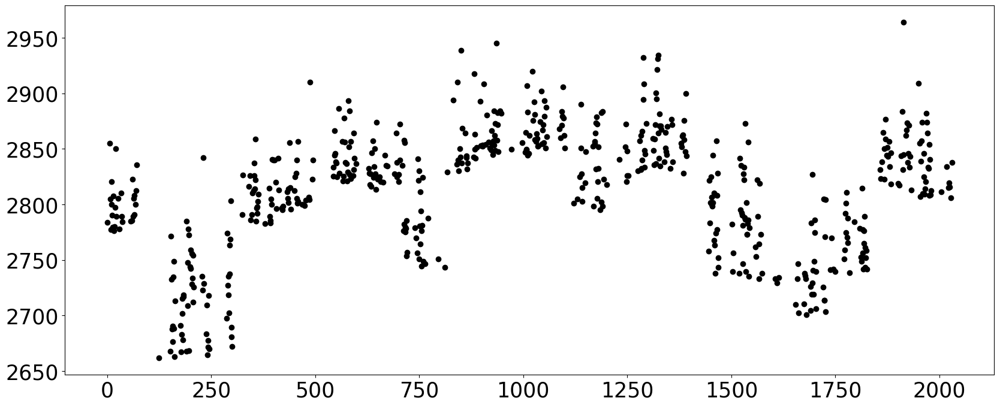

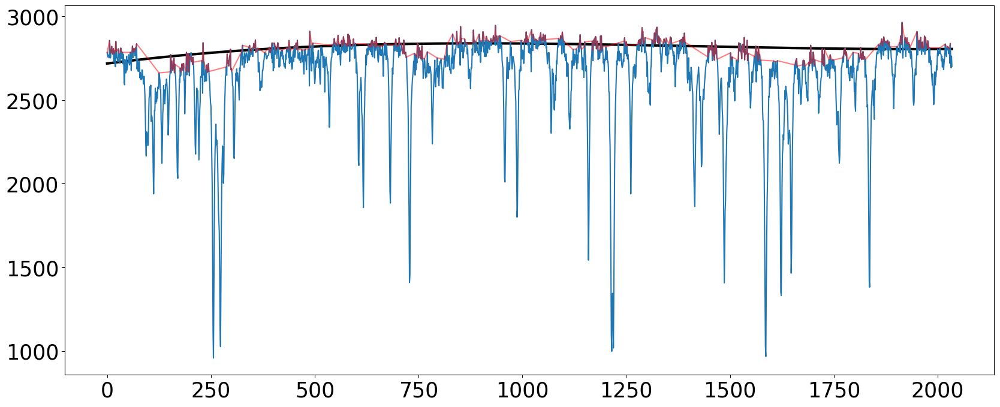

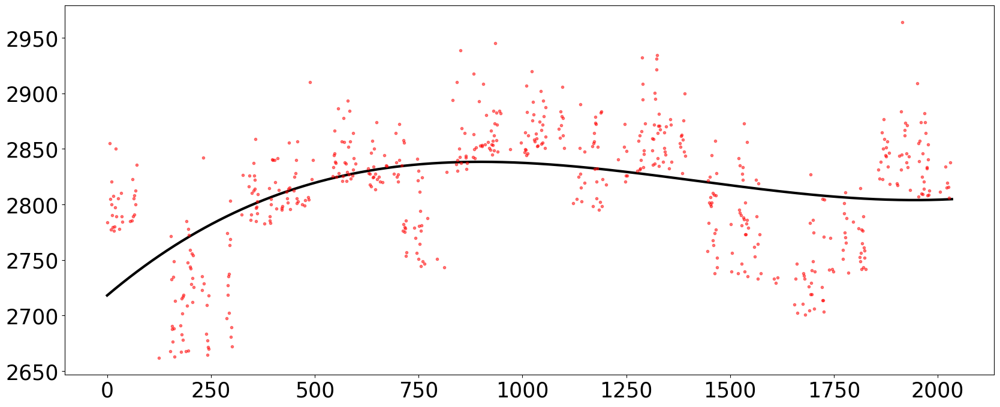

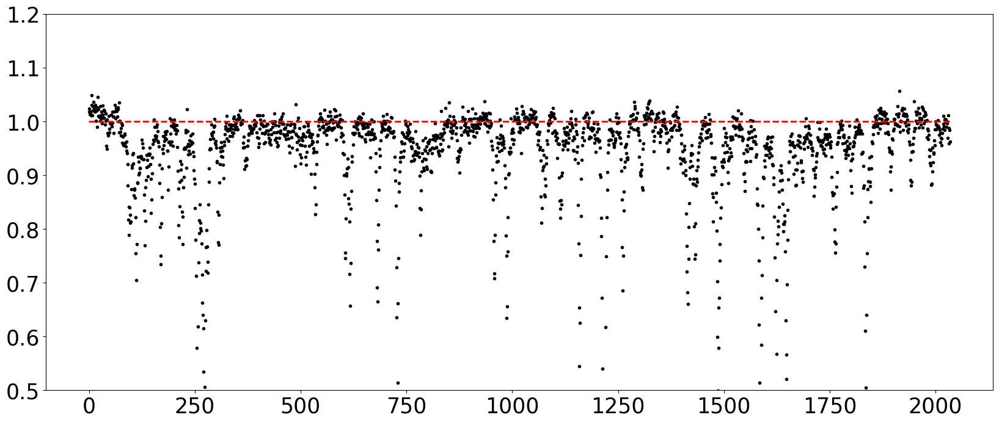

In [43]:
bins = 20
p_order = 3
fraction = 0.3
plot = True
wave_n2, flux_n2 = Normalization(wave2, flux2, bins, p_order, fraction, plot, section=0)

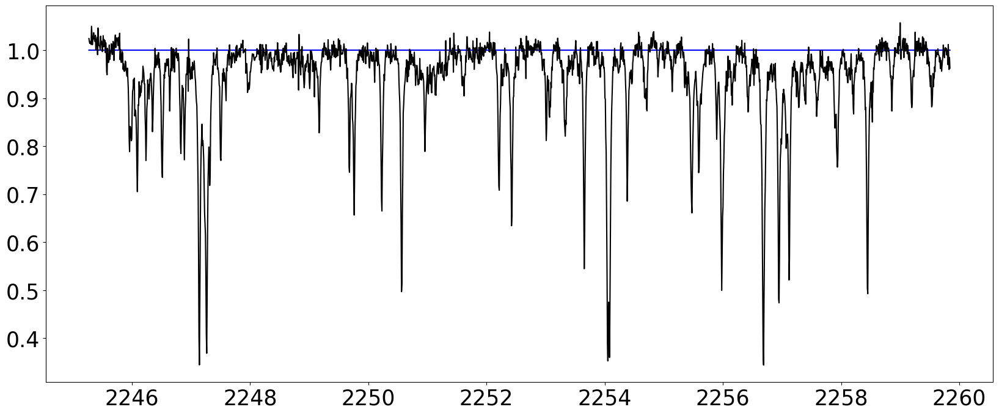

In [44]:
plt.plot(wave2, np.ones_like(wave2), 'b')
plt.plot(wave_n2 ,flux_n2,'k')
full_wave_n.extend(wave_n2)
full_flux_n.extend(flux_n2)

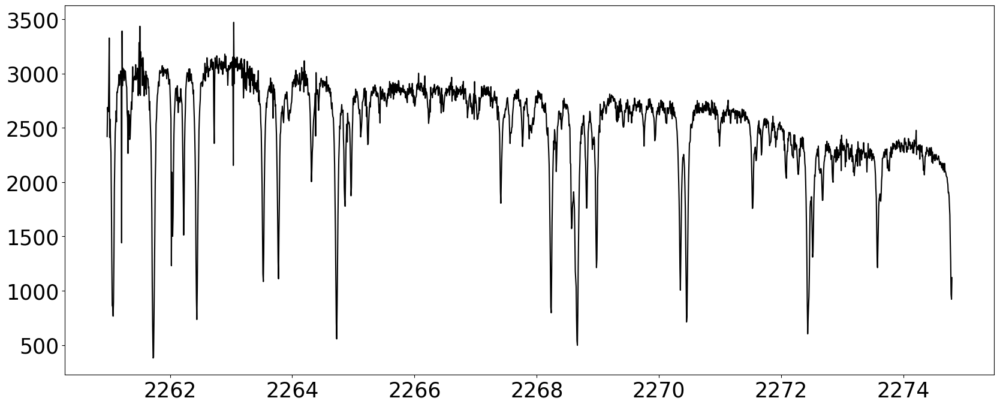

In [45]:
wave3 = []
flux3 = []

#i = 2
#wave1.extend(frame_WL[frame][i][7:-7])
#flux1.extend(np.array(frame_spec[frame][i][7:-7])+190)
#i = 8
#wave2.extend(frame_WL[frame][i][6:-7])
#flux2.extend(frame_spec[frame][i][6:-7])
i = 14
wave3.extend(frame_WL[frame][i][8:-8])
flux3.extend(frame_spec[frame][i][8:-8])

#print(len(wave))

wave3 = np.array(wave3)
flux3 = np.array(flux3)

plt.plot(wave3,flux3,'k')

[-7.28565480e-08 -1.21198766e-04 -3.60408047e-01  2.79804406e+03]


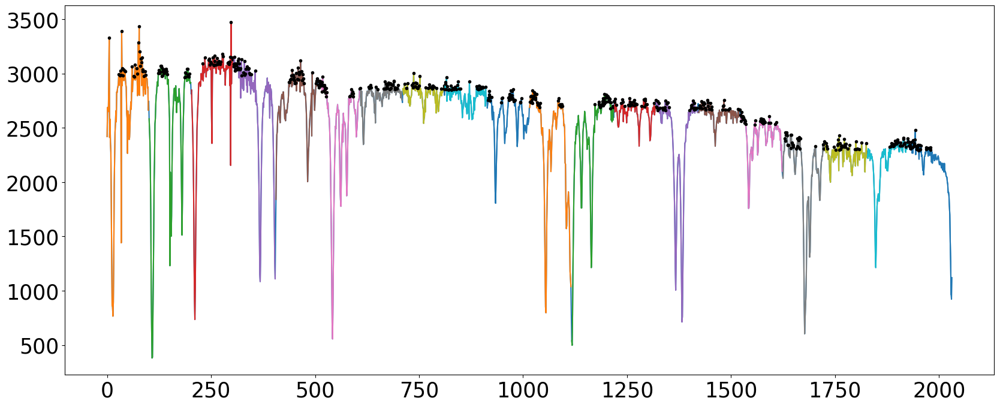

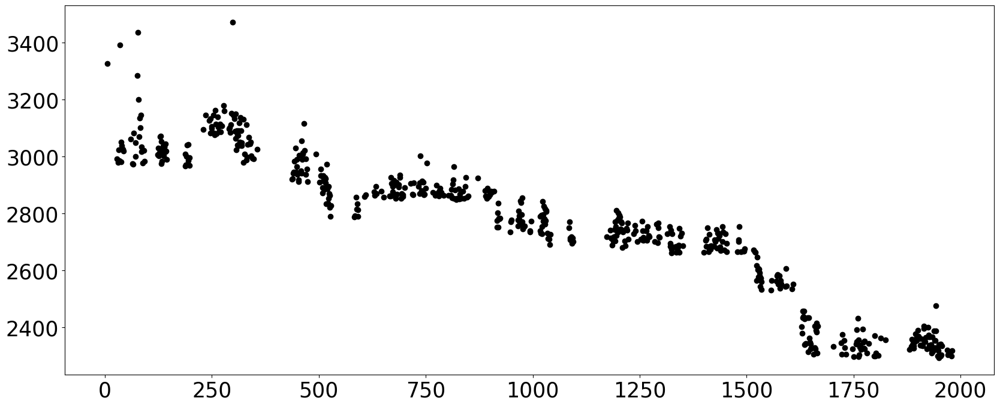

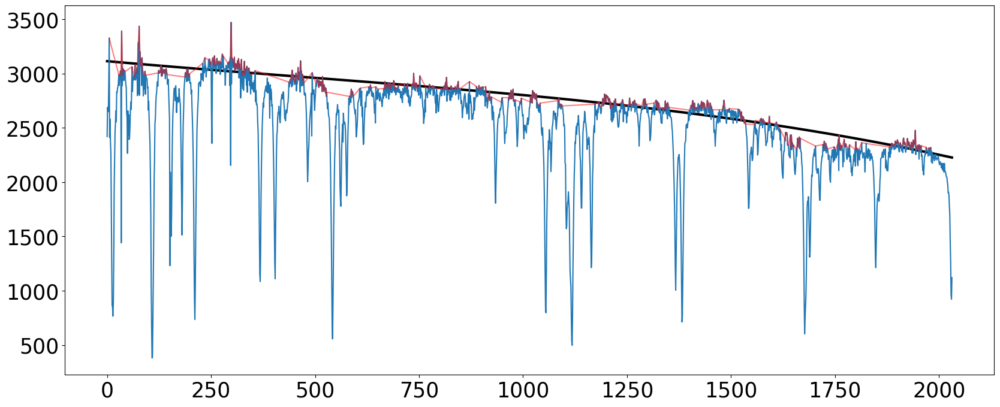

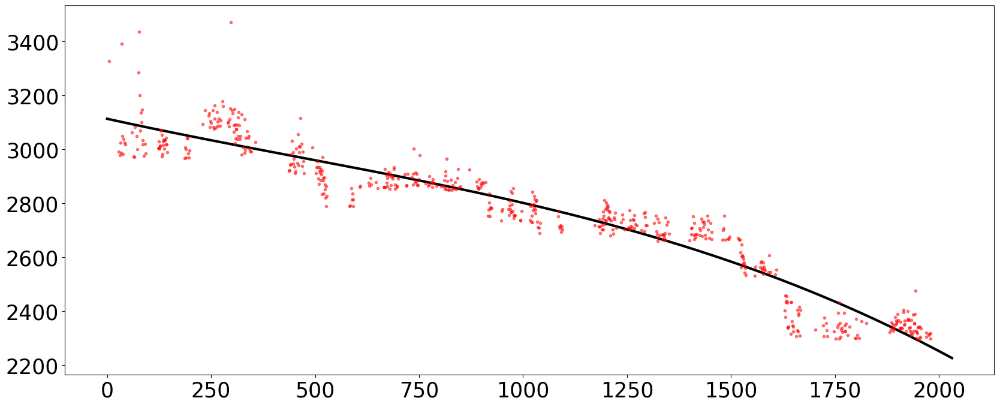

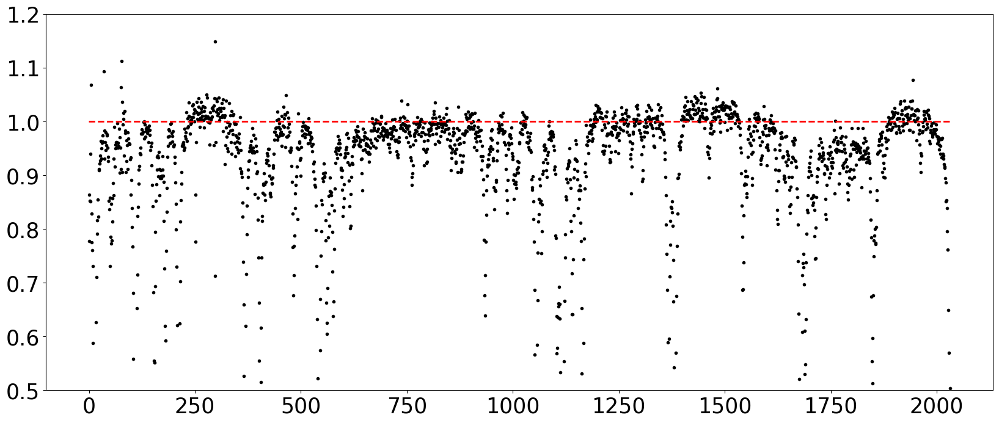

In [46]:
bins = 20
p_order = 3
fraction = 0.3
plot = True
wave_n3, flux_n3 = Normalization(wave3, flux3, bins, p_order, fraction, plot, section=0)

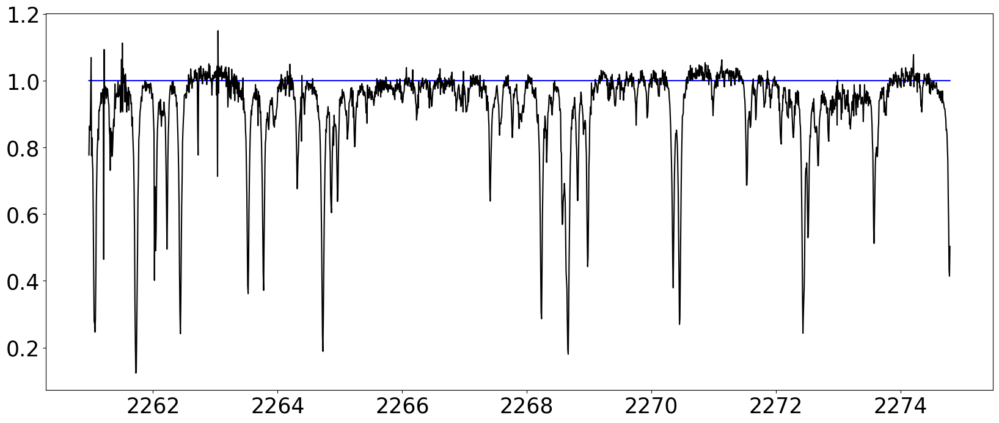

In [47]:
plt.plot(wave3, np.ones_like(wave3), 'b')
plt.plot(wave_n3 ,flux_n3,'k')
full_wave_n.extend(wave_n3)
full_flux_n.extend(flux_n3)

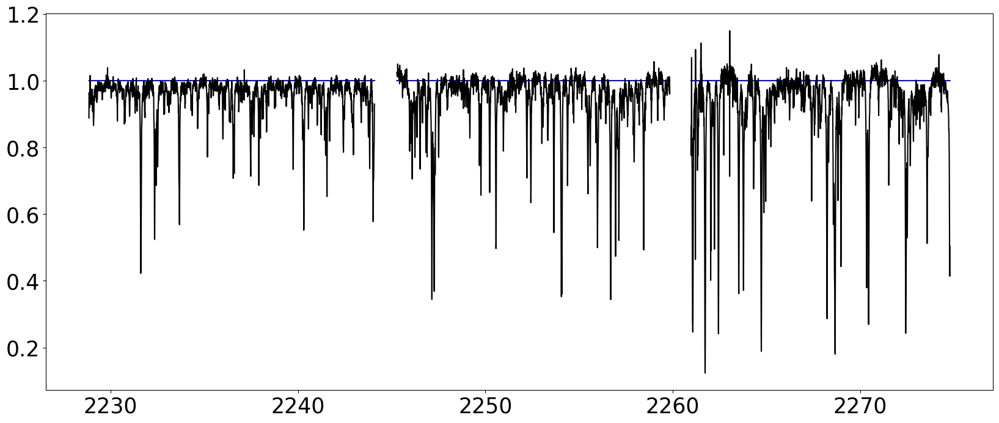

In [48]:
plt.plot(wave1, np.ones_like(wave1), 'b')
plt.plot(wave_n1 ,flux_n1,'k')
plt.plot(wave2, np.ones_like(wave2), 'b')
plt.plot(wave_n2 ,flux_n2,'k')
plt.plot(wave3, np.ones_like(wave3), 'b')
plt.plot(wave_n3 ,flux_n3,'k')
#plt.ylim(0,1.1)

# Testing Normalization part 5

2039


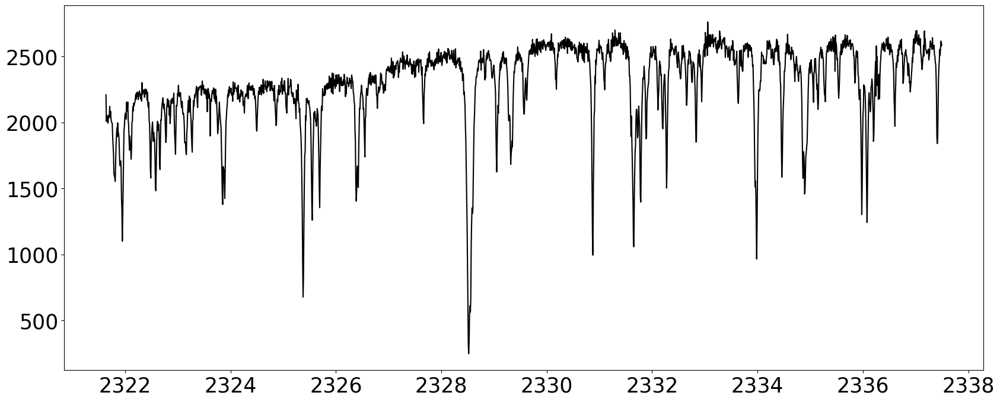

In [49]:
wave1 = []
flux1 = []

i = 1
wave1.extend(frame_WL[frame][i][7:-8])
flux1.extend(np.array(frame_spec[frame][i][7:-8]))
#i = 7
#wave.extend(frame_WL[frame][i][8:-9])
#flux.extend(frame_spec[frame][i][8:-9])
#i = 13
#wave.extend(frame_WL[frame][i][9:-10])
#flux.extend(frame_spec[frame][i][9:-10])

print(len(wave))

wave1 = np.array(wave1)
flux1 = np.array(flux1)

plt.plot(wave1,flux1,'k')

[-8.15280892e-17 -1.51763101e-15  4.81289339e-10 -6.35091522e-08
 -5.30787302e-04  2.69588944e-01  2.59565949e+03]


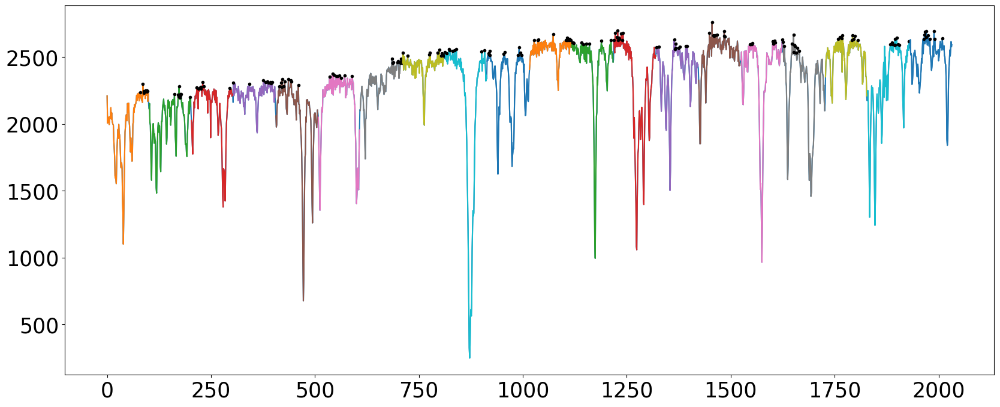

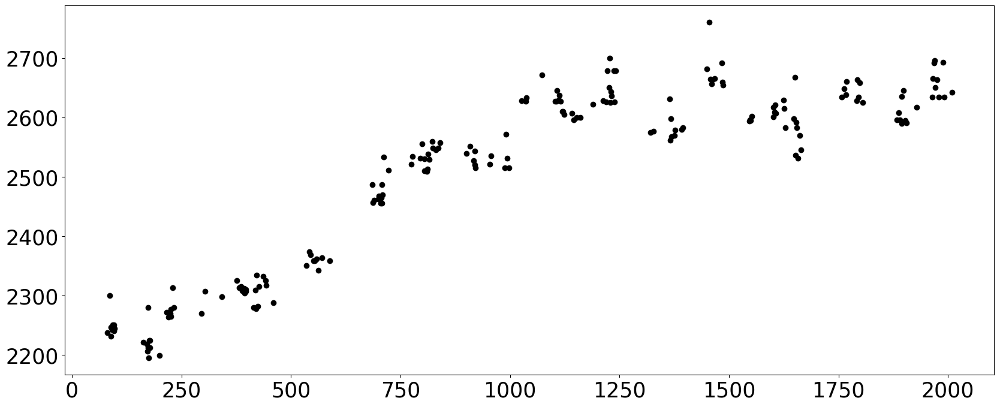

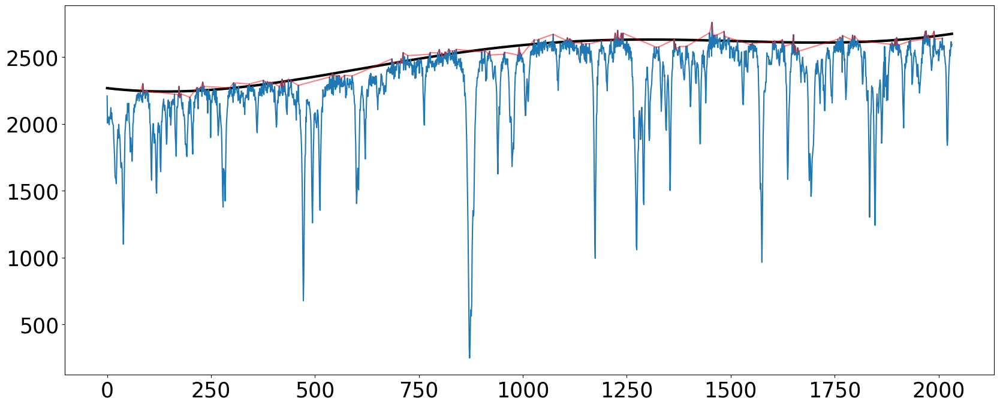

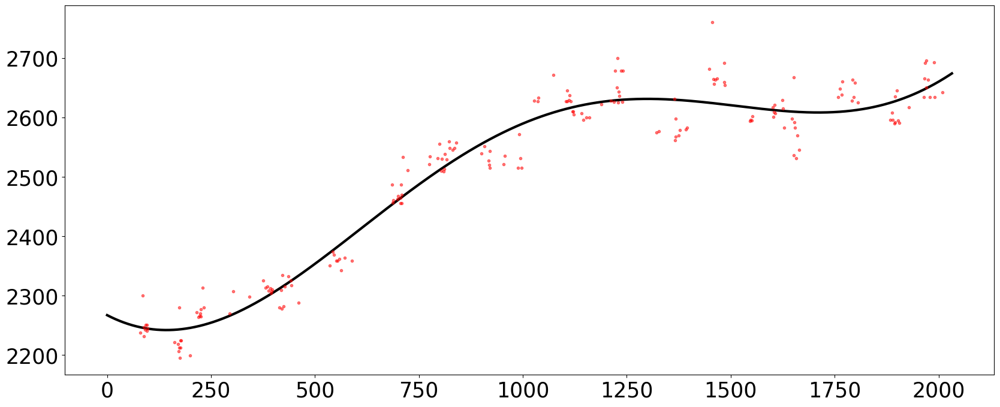

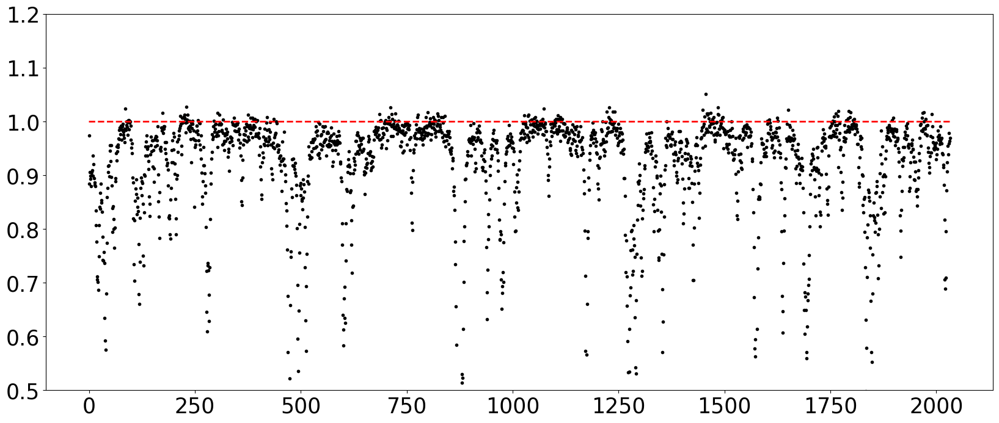

In [50]:
bins = 20
p_order = 6
fraction = 0.1
plot = True
wave_n1, flux_n1 = Normalization(wave1, flux1, bins, p_order, fraction, plot, section=0)

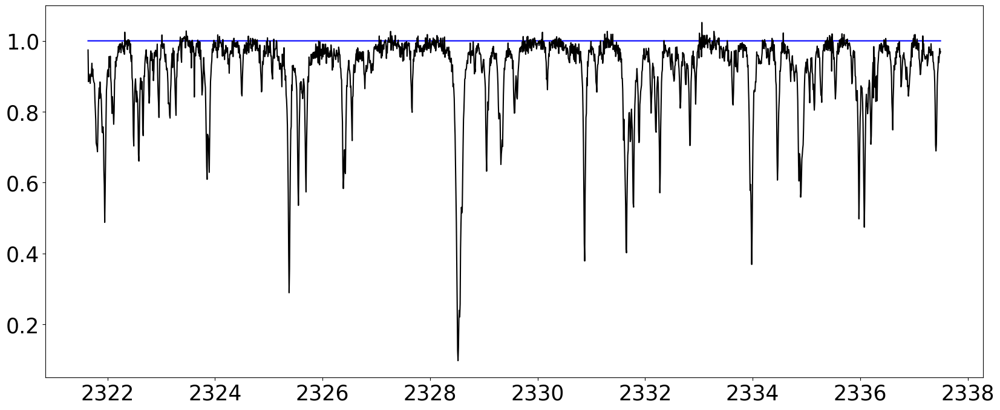

In [51]:
plt.plot(wave1, np.ones_like(wave1), 'b')
plt.plot(wave_n1 ,flux_n1,'k')
full_wave_n.extend(wave_n1)
full_flux_n.extend(flux_n1)

2039


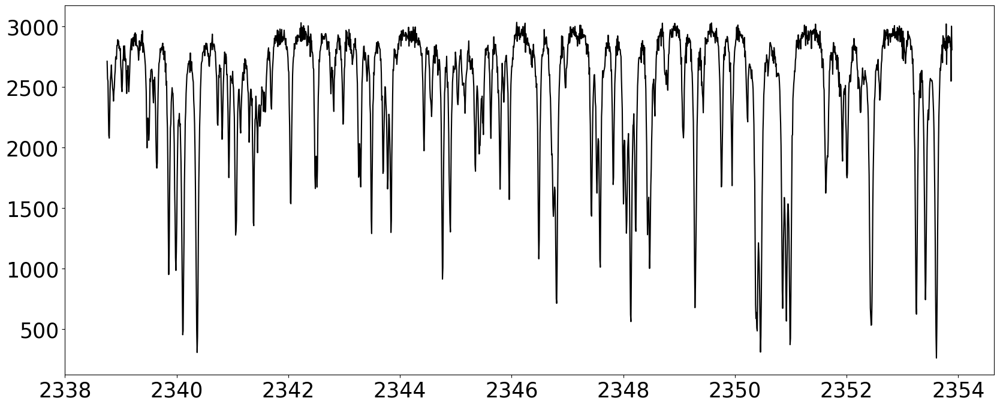

In [52]:
wave2 = []
flux2 = []

#i = 1
#wave1.extend(frame_WL[frame][i][7:-8])
#flux1.extend(np.array(frame_spec[frame][i][7:-8]))
i = 7
wave2.extend(frame_WL[frame][i][8:-9])
flux2.extend(frame_spec[frame][i][8:-9])
#i = 13
#wave.extend(frame_WL[frame][i][9:-10])
#flux.extend(frame_spec[frame][i][9:-10])

print(len(wave))

wave2 = np.array(wave2)
flux2 = np.array(flux2)

plt.plot(wave2,flux2,'k')

[ 5.04215754e-16 -1.27506051e-13 -6.47006692e-10  1.78850915e-07
  1.31048212e-04 -3.28641091e-02  2.94102070e+03]


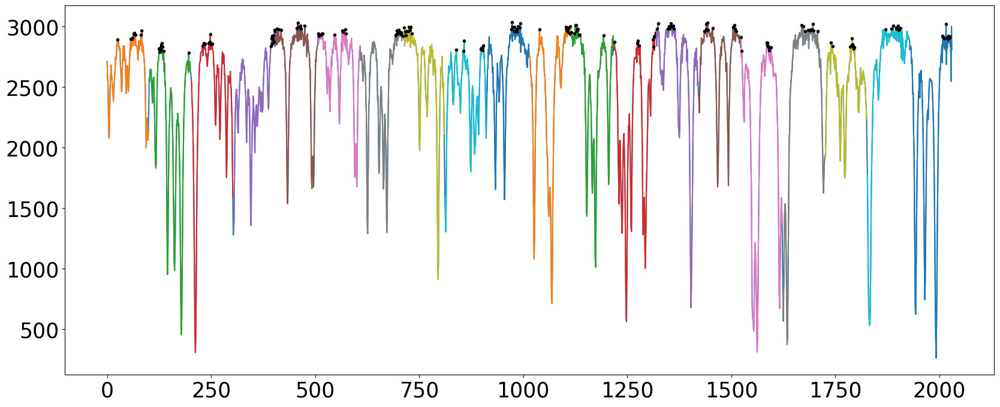

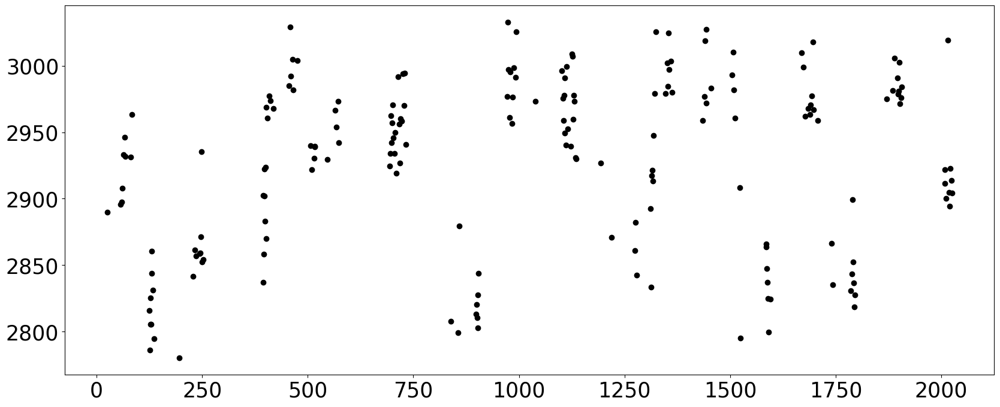

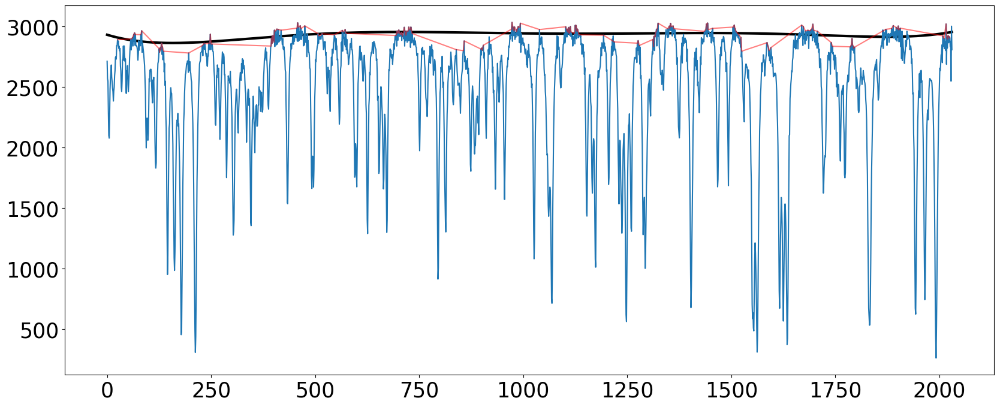

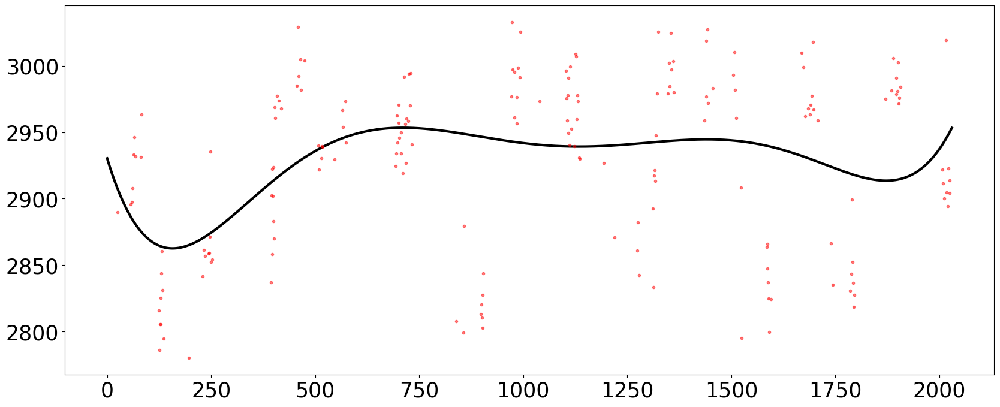

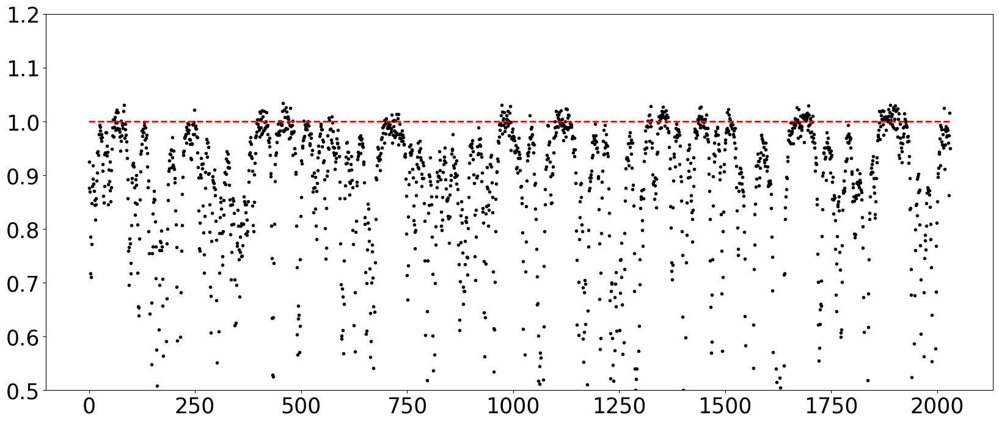

In [53]:
bins = 20
p_order = 6
fraction = 0.1
plot = True
wave_n2, flux_n2 = Normalization(wave2, flux2, bins, p_order, fraction, plot, section=0)

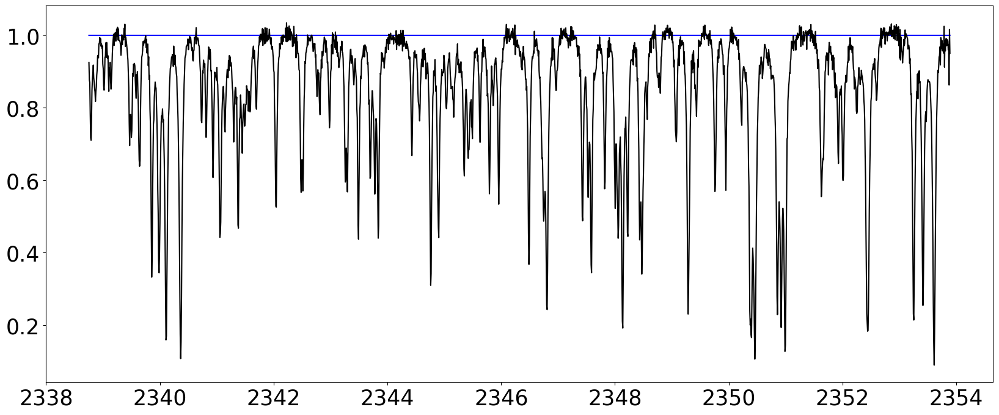

In [54]:
plt.plot(wave2, np.ones_like(wave2), 'b')
plt.plot(wave_n2 ,flux_n2,'k')
full_wave_n.extend(wave_n2)
full_flux_n.extend(flux_n2)

2029


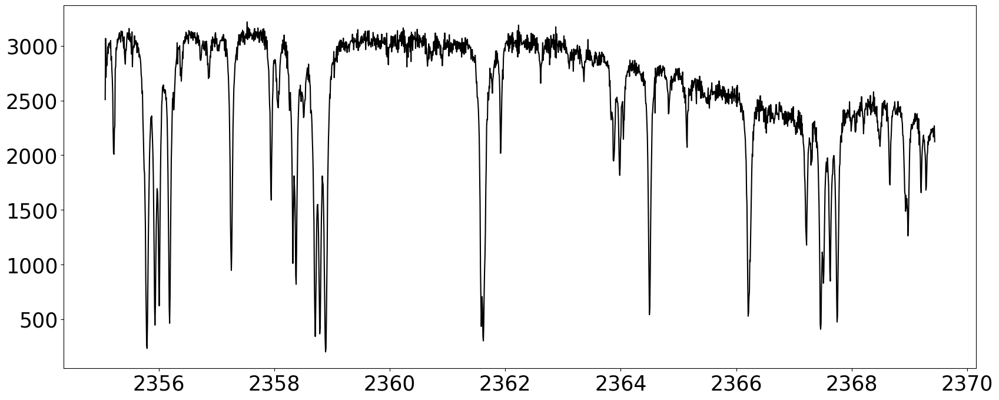

In [55]:
wave3 = []
flux3 = []

#i = 1
#wave1.extend(frame_WL[frame][i][7:-8])
#flux1.extend(np.array(frame_spec[frame][i][7:-8]))
#i = 7
#wave.extend(frame_WL[frame][i][8:-9])
#flux.extend(frame_spec[frame][i][8:-9])
i = 13
wave3.extend(frame_WL[frame][i][9:-10])
flux3.extend(frame_spec[frame][i][9:-10])

print(len(wave3))

wave3 = np.array(wave3)
flux3 = np.array(flux3)

plt.plot(wave3,flux3,'k')

[-1.10872805e-15  3.49752014e-13  2.34683485e-09 -2.02311768e-07
 -1.53373333e-03 -4.42317859e-01  3.08936797e+03]


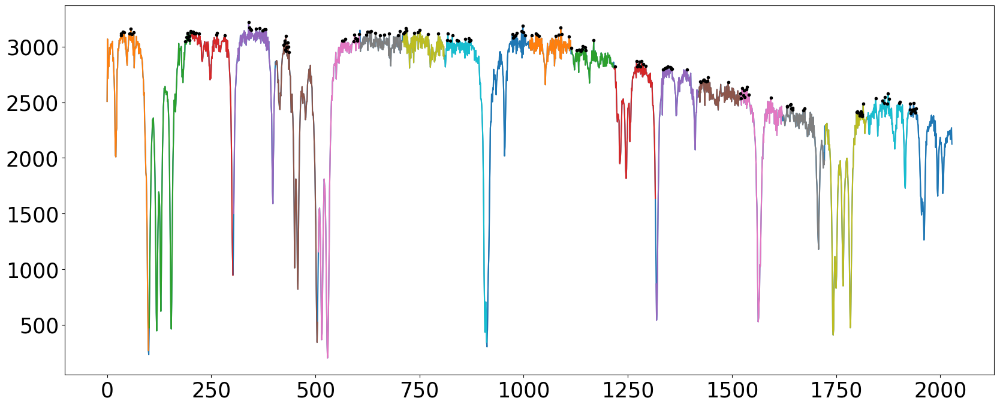

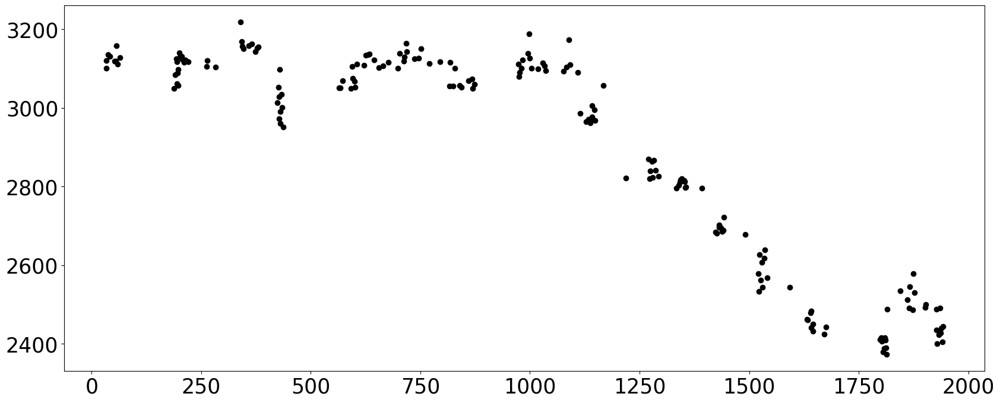

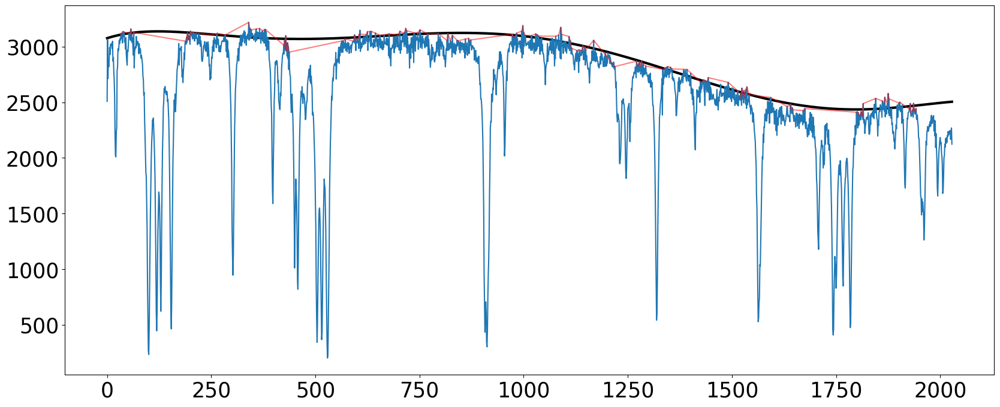

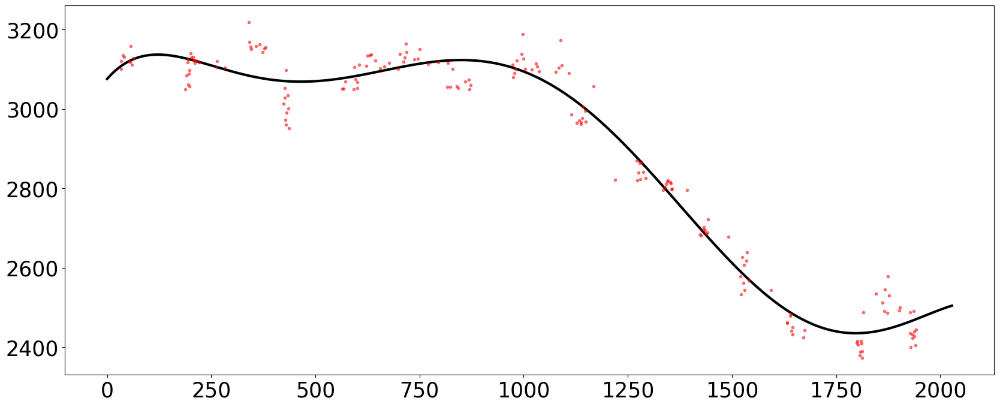

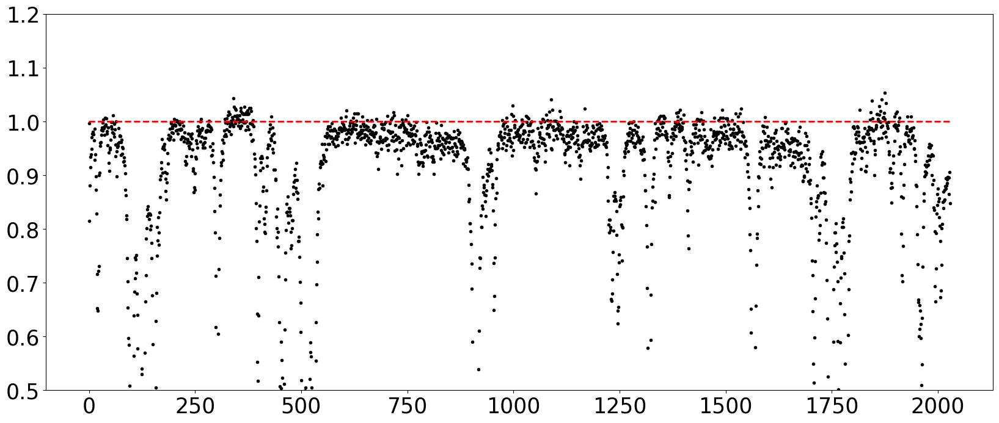

In [56]:
bins = 20
p_order = 6
fraction = 0.1
plot = True
wave_n3, flux_n3 = Normalization(wave3, flux3, bins, p_order, fraction, plot, section=0)

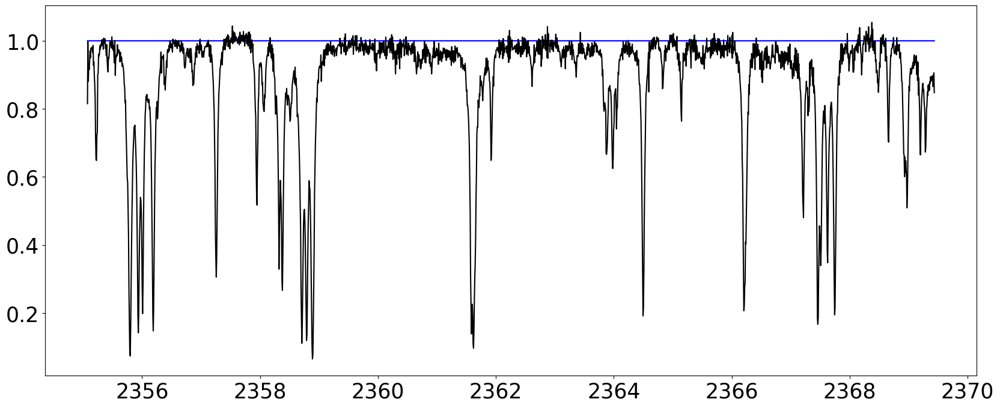

In [57]:
plt.plot(wave3, np.ones_like(wave3), 'b')
plt.plot(wave_n3 ,flux_n3,'k')
full_wave_n.extend(wave_n3)
full_flux_n.extend(flux_n3)

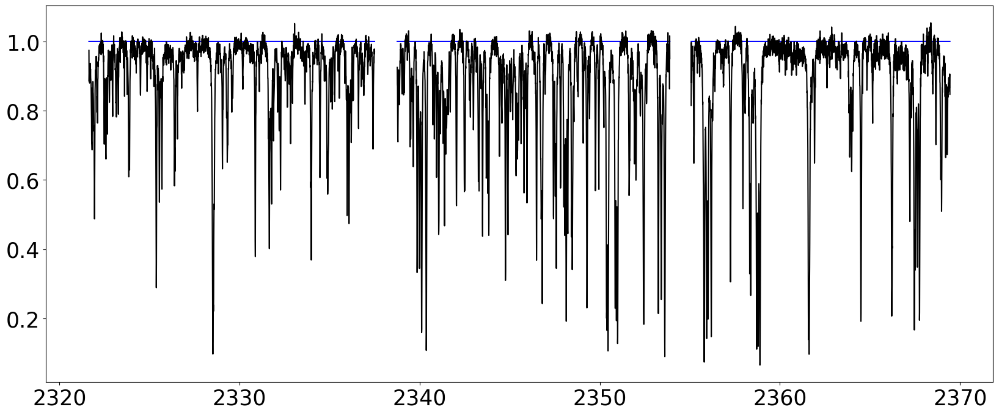

In [58]:
plt.plot(wave1, np.ones_like(wave1), 'b')
plt.plot(wave_n1 ,flux_n1,'k')
plt.plot(wave2, np.ones_like(wave2), 'b')
plt.plot(wave_n2 ,flux_n2,'k')
plt.plot(wave3, np.ones_like(wave3), 'b')
plt.plot(wave_n3 ,flux_n3,'k')
#plt.ylim(0,1.1)

# Testing Normalization part 6

2029


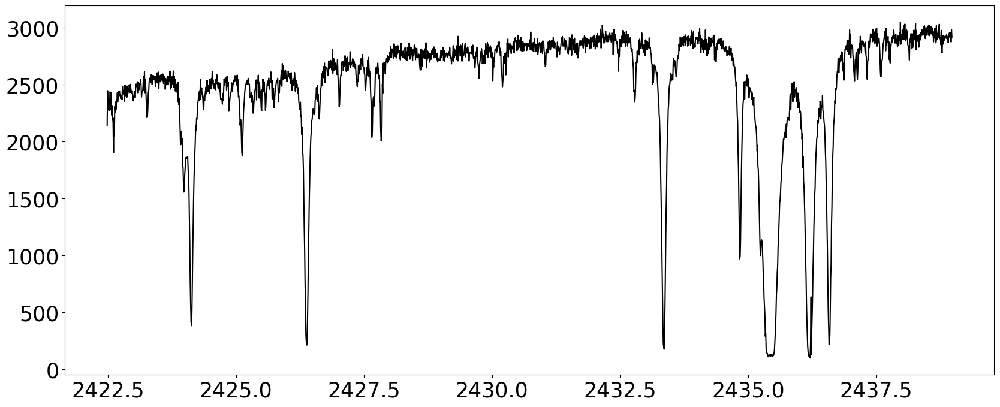

In [59]:
wave1 = []
flux1 = []

i = 0
wave1.extend(frame_WL[frame][i][9:-10])
flux1.extend(np.array(frame_spec[frame][i][9:-10]))
#i = 6
#wave.extend(frame_WL[frame][i][10:-11])
#flux.extend(frame_spec[frame][i][10:-11])
#i = 12
#wave.extend(frame_WL[frame][i][22:-22])
#flux.extend(frame_spec[frame][i][22:-22])

print(len(wave1))

wave1 = np.array(wave1)
flux1 = np.array(flux1)

plt.plot(wave1,flux1,'k')

[ 5.20162743e-08 -1.69527937e-04  1.81741009e-01  2.88909387e+03]


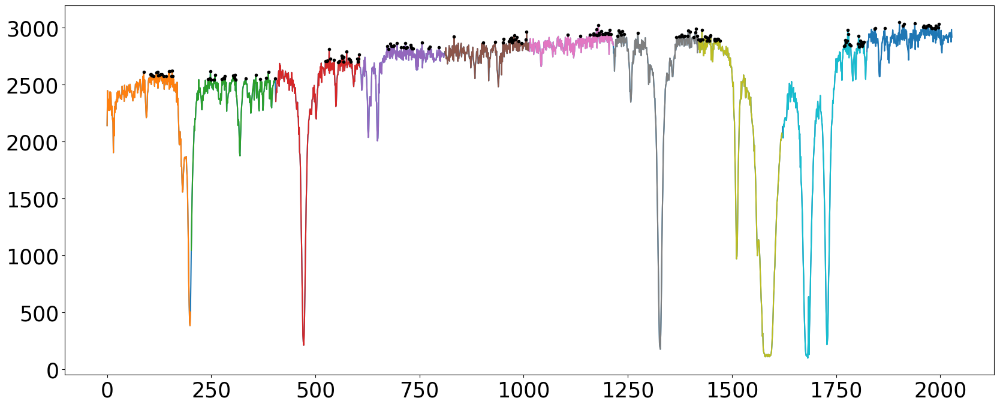

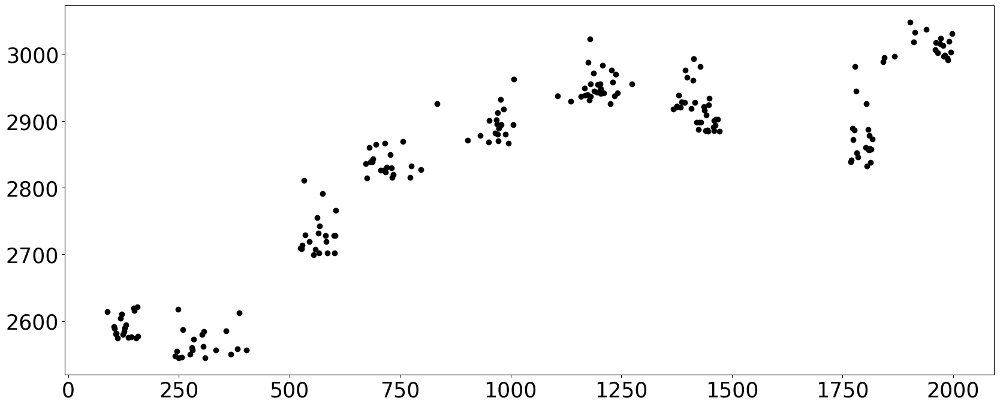

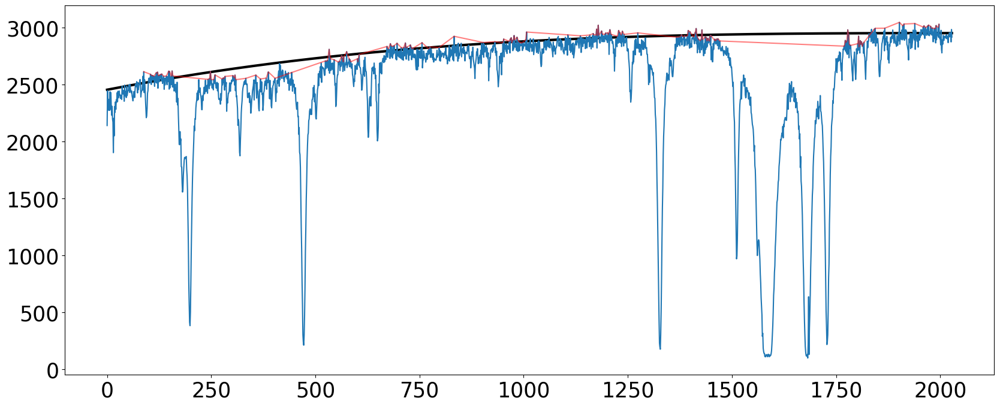

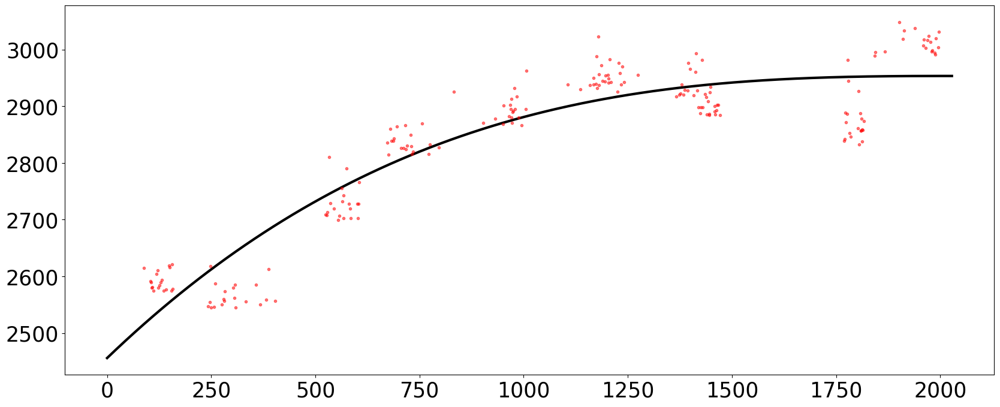

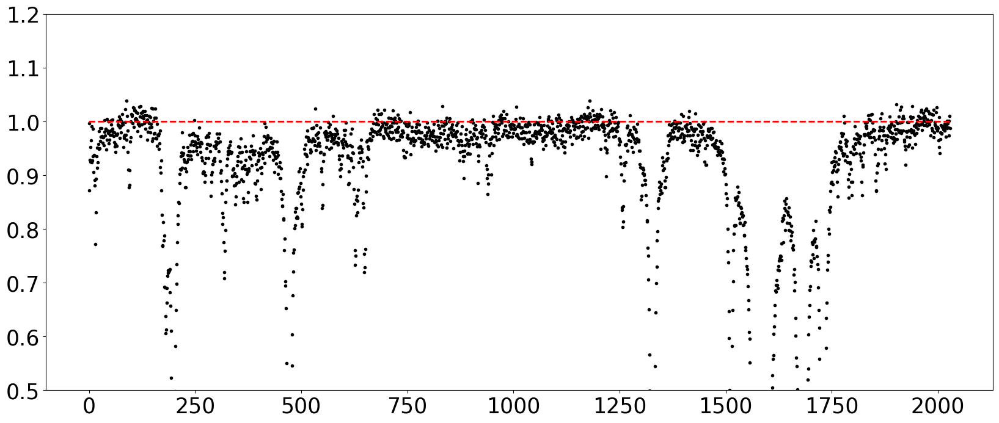

In [60]:
bins = 10
p_order = 3
fraction = 0.1
plot = True
wave_n1, flux_n1 = Normalization(wave1, flux1, bins, p_order, fraction, plot, section=0)

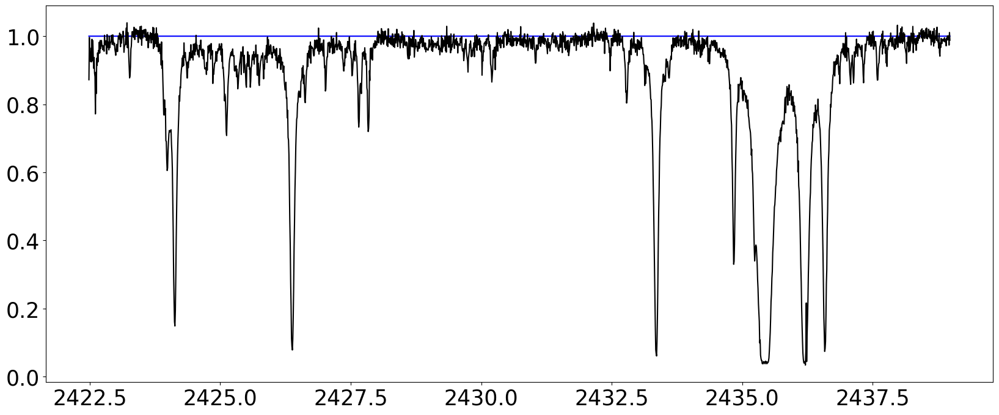

In [61]:
plt.plot(wave1, np.ones_like(wave1), 'b')
plt.plot(wave_n1 ,flux_n1,'k')
full_wave_n.extend(wave_n1)
full_flux_n.extend(flux_n1)

2027


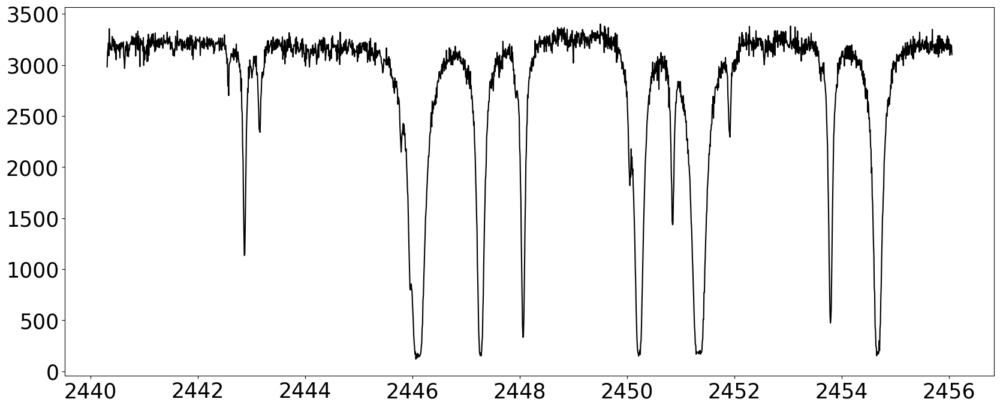

In [62]:
wave2 = []
flux2 = []

#i = 0
#wave2.extend(frame_WL[frame][i][9:-10])
#flux2.extend(np.array(frame_spec[frame][i][9:-10]))
i = 6
wave2.extend(frame_WL[frame][i][10:-11])
flux2.extend(frame_spec[frame][i][10:-11])
#i = 12
#wave.extend(frame_WL[frame][i][22:-22])
#flux.extend(frame_spec[frame][i][22:-22])

print(len(wave2))

wave2 = np.array(wave2)
flux2 = np.array(flux2)

plt.plot(wave2,flux2,'k')

[ 2.59471503e-16  3.69446308e-13 -4.66444754e-10 -5.09745912e-07
  3.07367882e-04  1.28443938e-01  3.18133486e+03]


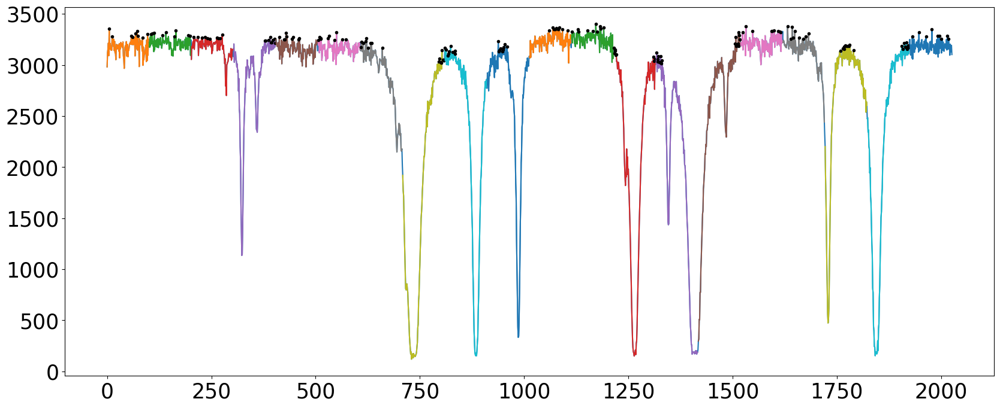

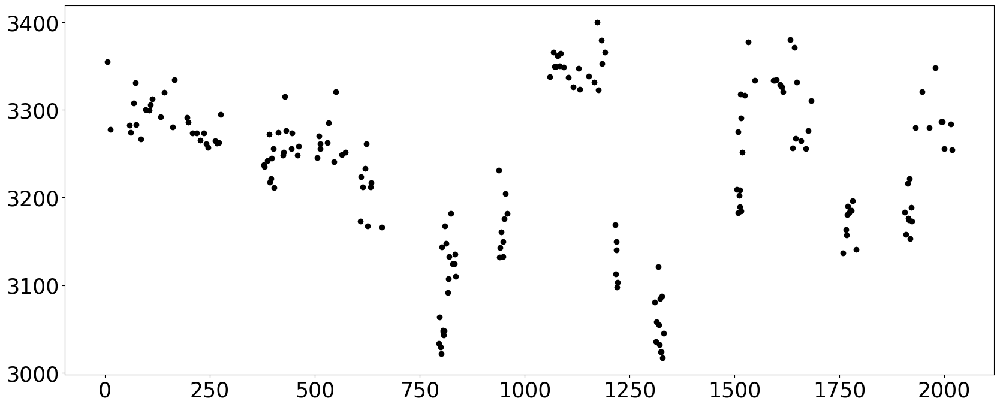

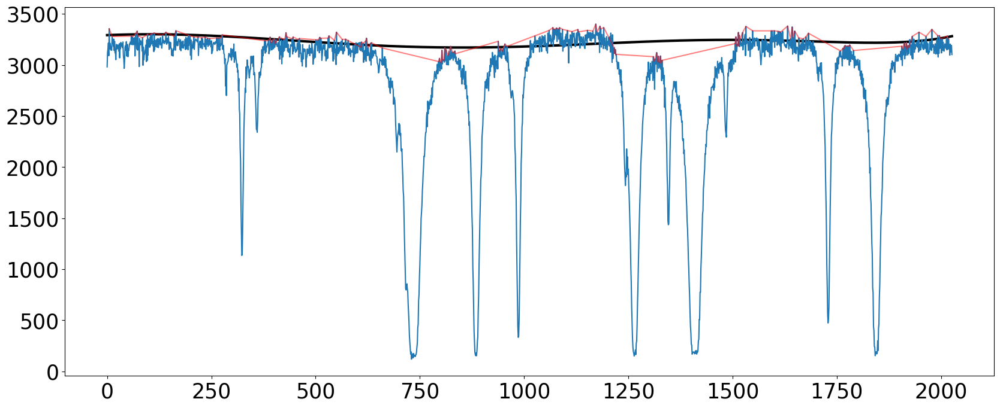

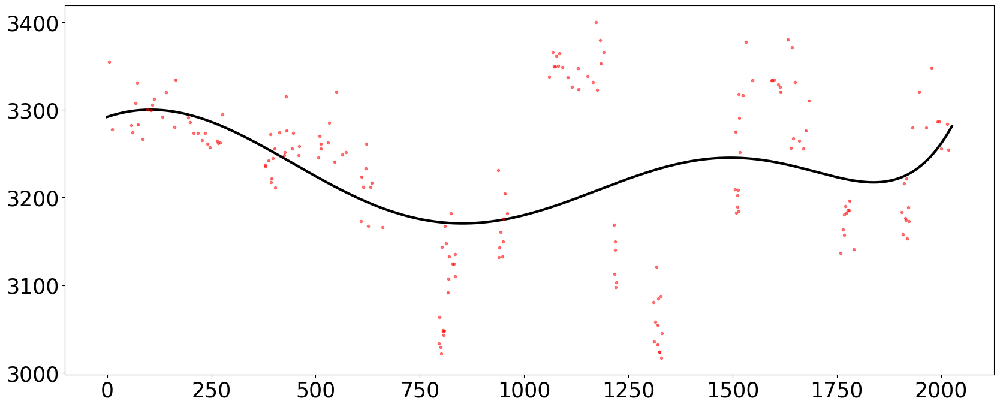

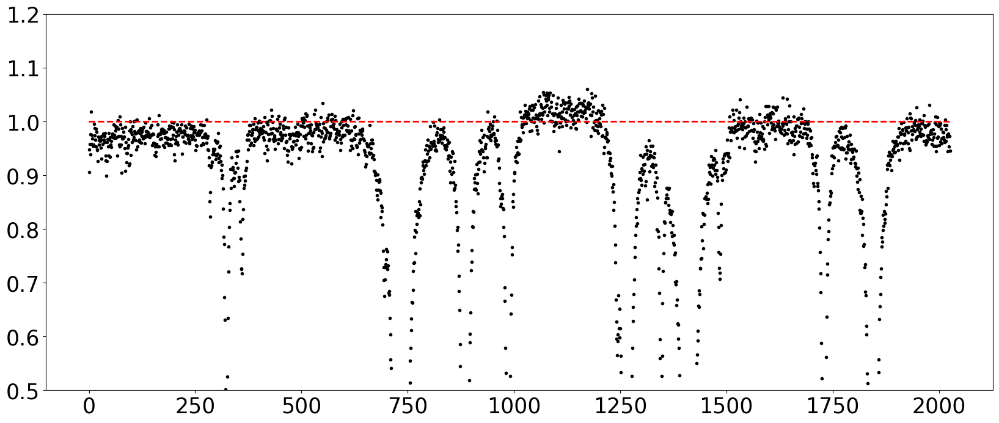

In [63]:
bins = 20
p_order = 6
fraction = 0.1
plot = True
wave_n2, flux_n2 = Normalization(wave2, flux2, bins, p_order, fraction, plot, section=0)

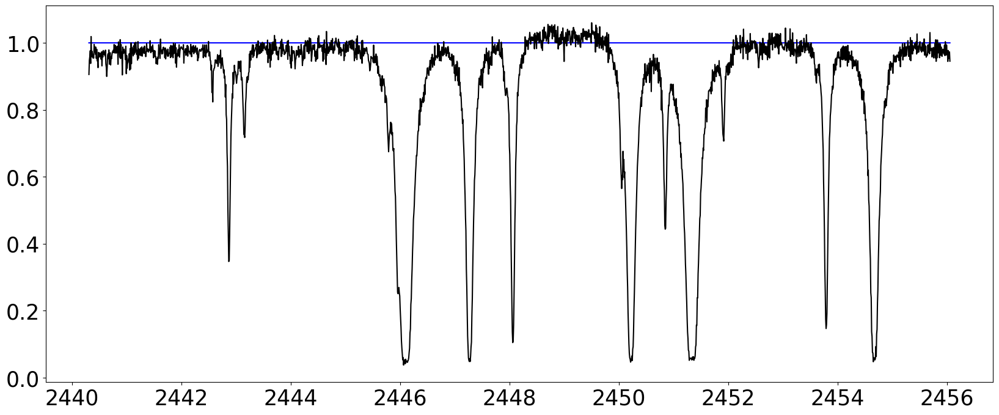

In [64]:
plt.plot(wave2, np.ones_like(wave2), 'b')
plt.plot(wave_n2 ,flux_n2,'k')
full_wave_n.extend(wave_n2)
full_flux_n.extend(flux_n2)

2004


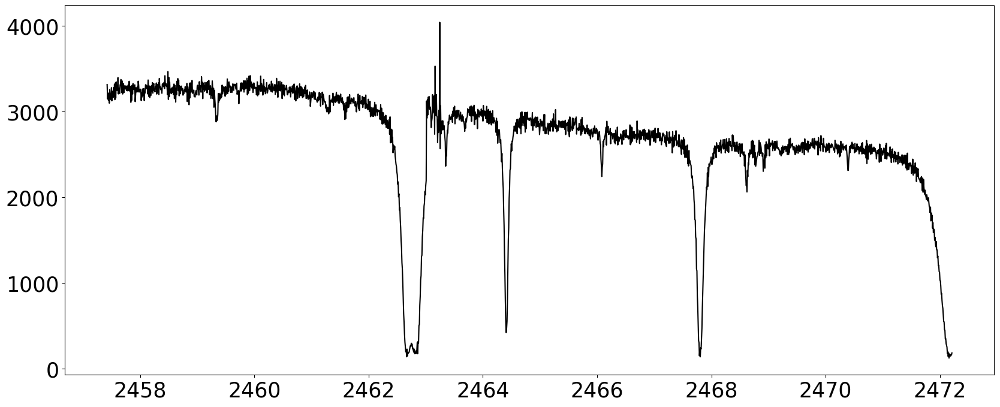

In [65]:
wave3 = []
flux3 = []

#i = 0
#wave1.extend(frame_WL[frame][i][9:-10])
#flux1.extend(np.array(frame_spec[frame][i][9:-10]))
#i = 6
#wave2.extend(frame_WL[frame][i][10:-11])
#flux2.extend(frame_spec[frame][i][10:-11])
i = 12
wave3.extend(frame_WL[frame][i][22:-22])
flux3.extend(frame_spec[frame][i][22:-22])

print(len(wave3))

wave3 = np.array(wave3)
flux3 = np.array(flux3)

plt.plot(wave3,flux3,'k')

[-5.76539975e-13 -5.75756882e-10  6.36493865e-07  4.19993743e-04
 -6.68683195e-01  2.89682161e+03]


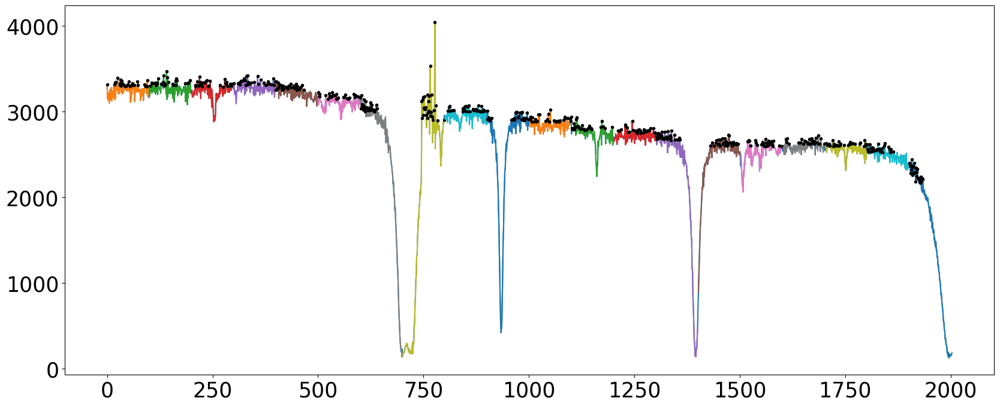

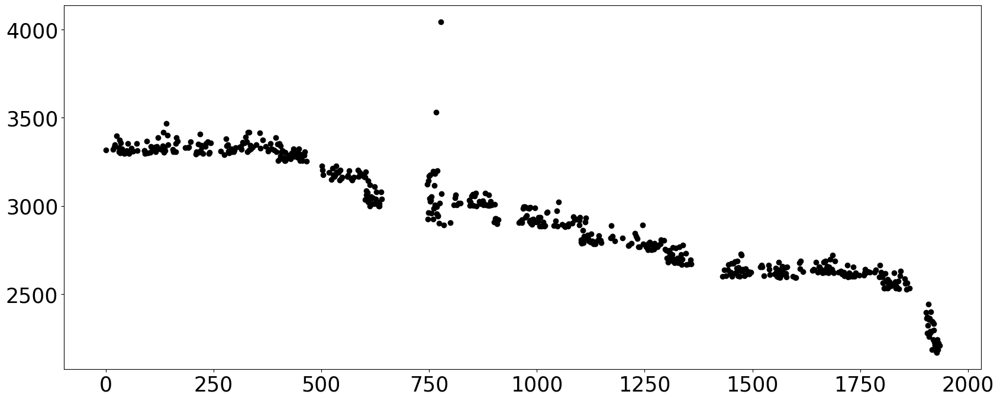

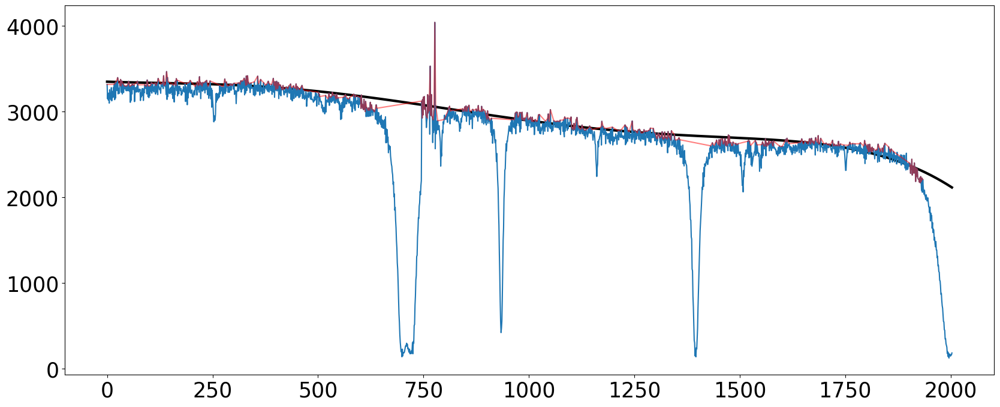

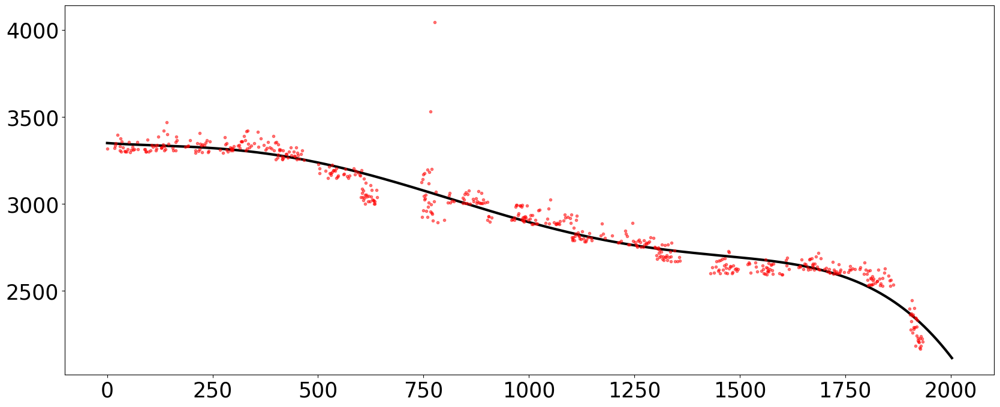

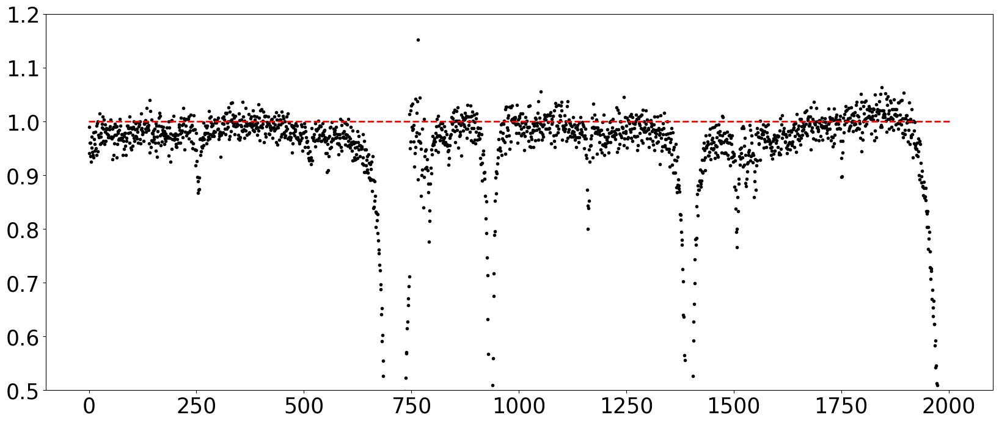

In [66]:
bins = 20
p_order = 5
fraction = 0.3
plot = True
wave_n3, flux_n3 = Normalization(wave3, flux3, bins, p_order, fraction, plot, section=0)

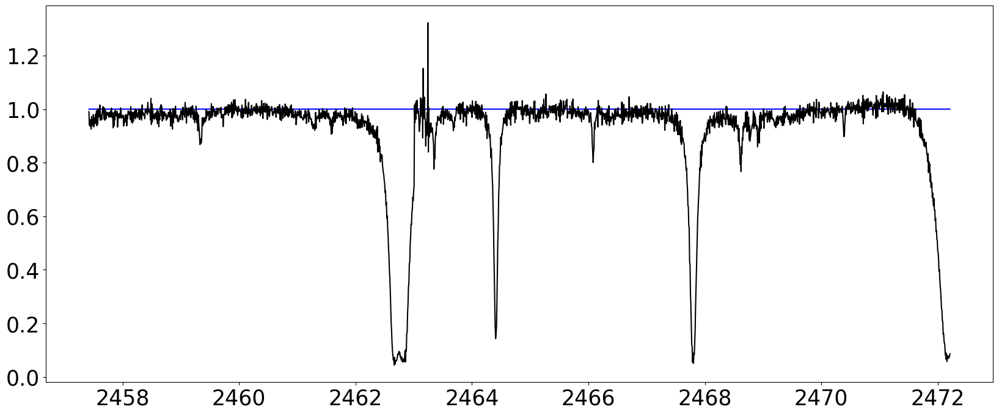

In [67]:
plt.plot(wave3, np.ones_like(wave3), 'b')
plt.plot(wave_n3 ,flux_n3,'k')
full_wave_n.extend(wave_n3)
full_flux_n.extend(flux_n3)

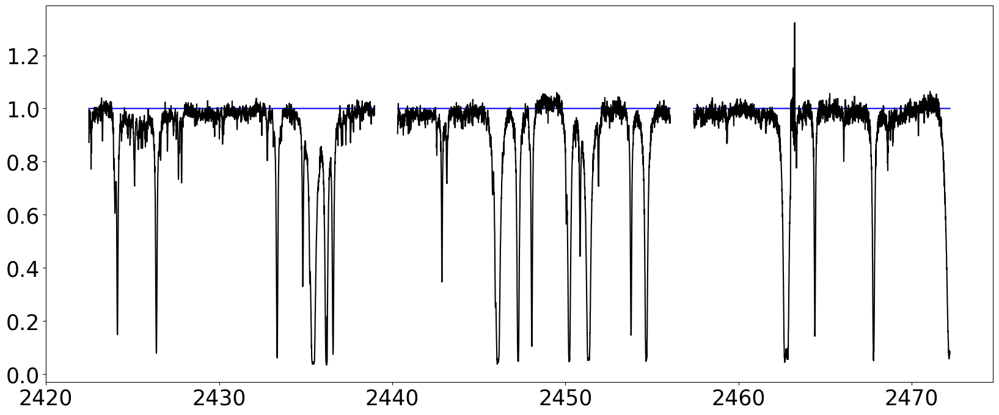

In [68]:
plt.plot(wave1, np.ones_like(wave1), 'b')
plt.plot(wave_n1 ,flux_n1,'k')
plt.plot(wave2, np.ones_like(wave2), 'b')
plt.plot(wave_n2 ,flux_n2,'k')
plt.plot(wave3, np.ones_like(wave3), 'b')
plt.plot(wave_n3 ,flux_n3,'k')
#plt.ylim(0,1.1)

# All of Them

In [69]:
full_wave_n = np.array(full_wave_n)
full_flux_n = np.array(full_flux_n)

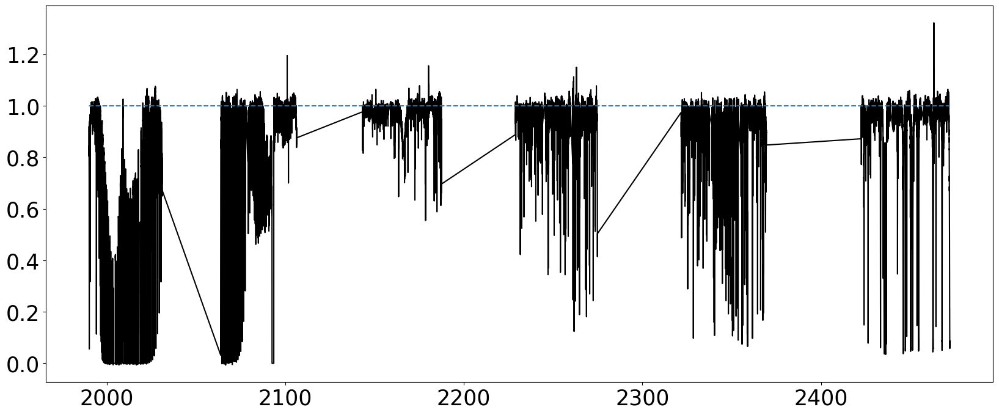

In [70]:
plt.plot(full_wave_n, full_flux_n, 'k')
plt.plot(full_wave_n, np.ones_like(full_wave_n), '--')

In [71]:
np.save("data_nomalized", (full_wave_n, full_flux_n))